In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import pointbiserialr
import warnings
warnings.filterwarnings("ignore")
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split, KFold
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_curve, roc_auc_score, confusion_matrix, classification_report, accuracy_score, precision_score, recall_score, f1_score, mean_squared_error
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
from skopt import BayesSearchCV
from skopt.space import Real, Integer, Categorical
from sklearn import tree
import numpy as np
from keras.models import Sequential
from keras.layers import Dense
from keras.utils import to_categorical
import lightgbm as lgb
from lightgbm import LGBMClassifier
import logging
from sklearn.svm import SVC
import time

In [2]:
file_path = 'SBA_tisztitott.csv'
df_sba=pd.read_csv(file_path, parse_dates=['ApprovalDate','DisbursementDate'])
df_sba.head()

,Name,City,State,Zip,Bank,BankState,NAICS,ApprovalDate,ApprovalFY,Term,...,RevLineCr,LowDoc,ChgOffDate,DisbursementDate,DisbursementGross,BalanceGross,ChgOffPrinGr,GrAppv,SBA_Appv,PaidBack
0,ABC HOBBYCRAFT,EVANSVILLE,IN,47711,FIFTH THIRD BANK,OH,45,1997-02-28,1997,84,...,False,True,NaN,1999-02-28,60000.0,0.0,0.0,60000.0,48000.0,True
1,LANDMARK BAR & GRILLE (THE),NEW PARIS,IN,46526,1ST SOURCE BANK,IN,72,1997-02-28,1997,60,...,False,True,NaN,1997-05-31,40000.0,0.0,0.0,40000.0,32000.0,True
2,"WHITLOCK DDS, TODD M.",BLOOMINGTON,IN,47401,GRANT COUNTY STATE BANK,IN,62,1997-02-28,1997,180,...,False,False,NaN,1997-12-31,287000.0,0.0,0.0,287000.0,215250.0,True
3,"BIG BUCKS PAWN & JEWELRY, LLC",BROKEN ARROW,OK,74012,1ST NATL BK & TR CO OF BROKEN,OK,0,1997-02-28,1997,60,...,False,True,NaN,1997-06-30,35000.0,0.0,0.0,35000.0,28000.0,True
4,"ANASTASIA CONFECTIONS, INC.",ORLANDO,FL,32801,FLORIDA BUS. DEVEL CORP,FL,0,1997-02-28,1997,240,...,False,False,NaN,1997-05-14,229000.0,0.0,0.0,229000.0,229000.0,True


In [3]:
def describe_data(df):
    print(len(df_sba))
    column=[]
    d_type=[]
    uniques=[]
    n_uniques=[]
    nan=[]
    d_min=[]
    d_max=[]

    for i in df.columns:
        column.append(i)
        d_type.append(df[i].dtypes)
        uniques.append(df[i].unique()[:5])
        n_uniques.append(df[i].nunique())
        nan.append(df[i].isna().sum()/len(df)*100)
        if df[i].dtype != 'object':
            d_min.append(df[i].min())
        else:
            d_min.append(None)
        if df[i].dtype != 'object':
            d_max.append(df[i].max())
        else:
            d_max.append(None)

    return pd.DataFrame({'Column': column, 'type': d_type, 'unique sample': uniques, 'uniques': n_uniques, 'NaN%': nan, 'Min': d_min, 'Max': d_max})



In [4]:
describe_data(df_sba)

868076


,Column,type,unique sample,uniques,NaN%,Min,Max
0,Name,object,"[ABC HOBBYCRAFT, LANDMARK BAR & GRILLE (THE), ...",755201,0.000000,None,None
1,City,object,"[EVANSVILLE, NEW PARIS, BLOOMINGTON, BROKEN AR...",32035,0.000000,None,None
2,State,object,"[IN, OK, FL, CT, NJ]",51,0.000000,None,None
3,Zip,int64,"[47711, 46526, 47401, 74012, 32801]",33392,0.000000,0,99999
4,Bank,object,"[FIFTH THIRD BANK, 1ST SOURCE BANK, GRANT COUN...",5784,0.000000,None,None
5,BankState,object,"[OH, IN, OK, FL, DE]",56,0.000000,None,None
6,NAICS,int64,"[45, 72, 62, 0, 33]",25,0.000000,0,92
7,ApprovalDate,datetime64[ns],"[1997-02-28 00:00:00, 1980-06-02 00:00:00, 200...",9781,0.000000,1969-04-28 00:00:00,2014-06-25 00:00:00
8,ApprovalFY,int64,"[1997, 1980, 2006, 1998, 1999]",46,0.000000,1969,2014
9,Term,int64,"[84, 60, 180, 240, 120]",410,0.000000,0,569


In [5]:
df_sba = df_sba.drop(columns=['ChgOffDate'])

In [6]:
df_sba['DisbursementGross'] = df_sba['DisbursementGross'].astype('int64')
df_sba['BalanceGross'] = df_sba['BalanceGross'].astype('int64')
df_sba['ChgOffPrinGr'] = df_sba['ChgOffPrinGr'].astype('int64')
df_sba['GrAppv'] = df_sba['GrAppv'].astype('int64')
df_sba['SBA_Appv'] = df_sba['SBA_Appv'].astype('int64')
df_sba['PaidBack'] = df_sba['PaidBack'].astype(int)

In [7]:
#nem relevánsak
df_sba = df_sba.drop(columns=['City','Zip','Name','Bank','BankState','ApprovalDate','ApprovalFY','DisbursementDate'],axis=1)

In [8]:
#nem ismerhetjük hitelkérelem elbírálása során
df_sba = df_sba.drop(columns=['BalanceGross','ChgOffPrinGr','GrAppv'],axis=1)

In [9]:
len(df_sba[df_sba.NAICS==0])

197201

In [10]:
df_sba=df_sba[df_sba.NAICS!=0]

In [11]:
len(df_sba[df_sba.UrbanRural==0])

140245

In [12]:
df_sba=df_sba[df_sba.UrbanRural!=0]

In [13]:
describe_data(df_sba)

530630


,Column,type,unique sample,uniques,NaN%,Min,Max
0,State,object,"[NC, AR, CA, FL, LA]",51,0.0,None,None
1,NAICS,int64,"[44, 72, 61, 23, 53]",24,0.0,11,92
2,Term,int64,"[162, 126, 83, 84, 60]",337,0.0,0,569
3,NoEmp,int64,"[2, 7, 18, 4, 3]",406,0.0,0,8000
4,NewExist,int64,"[2, 1]",2,0.0,1,2
5,CreateJob,int64,"[0, 5, 4, 1, 20]",204,0.0,0,5085
6,RetainedJob,int64,"[0, 23, 4, 6, 1]",310,0.0,0,9500
7,UrbanRural,int64,"[1, 2]",2,0.0,1,2
8,RevLineCr,bool,"[False, True]",2,0.0,False,True
9,LowDoc,bool,"[False, True]",2,0.0,False,True


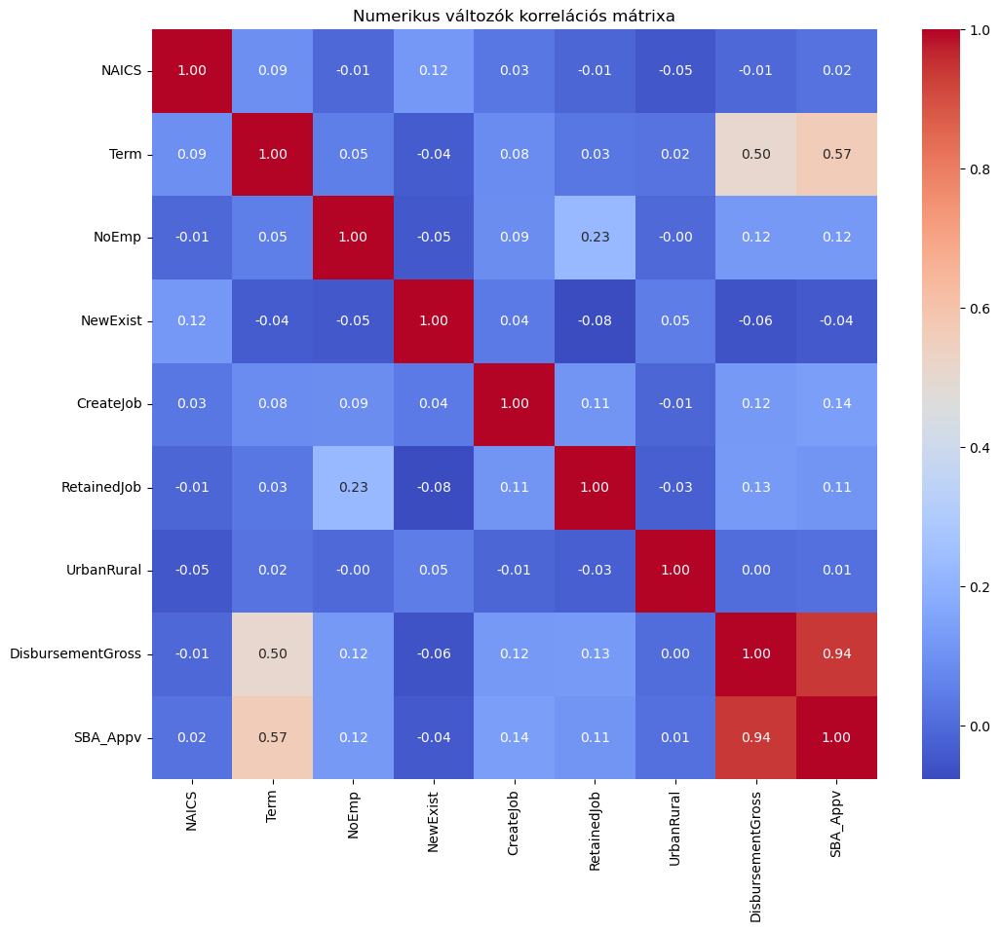

In [14]:
numeric_columns = df_sba.select_dtypes(include=['int64']).columns
correlation_matrix = df_sba[numeric_columns].corr()
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Numerikus változók korrelációs mátrixa')
plt.show()

In [15]:
df_sba['UrbanRural'] = df_sba['UrbanRural'].replace({2: 0, 1: 1})
df_sba['NewExist'] = df_sba['NewExist'].replace({2: 1, 1: 0})
df_sba['RevLineCr'] = df_sba['RevLineCr'].replace({True: 1, False: 0})
df_sba['LowDoc'] = df_sba['LowDoc'].replace({True: 1, False: 0})

In [16]:
correlation_data = []
continuous_variables = ['Term', 'NoEmp', 'CreateJob', 'RetainedJob', 'DisbursementGross', 'SBA_Appv']
binary_variables=['UrbanRural','NewExist','RevLineCr','LowDoc','PaidBack']
for binary_variable in binary_variables:
    print(f"{binary_variable}")
    for continuous_variable in continuous_variables:
        correlation_coefficient, p_value = pointbiserialr(df_sba[binary_variable], df_sba[continuous_variable])
        print(f"\t{continuous_variable}: {correlation_coefficient:.2f}, p érték: {p_value:.2f}")
        correlation_data.append({'Binary Variable': binary_variable, 'Continuous Variable': continuous_variable, 'Correlation Coefficient': correlation_coefficient})

UrbanRural
	Term: -0.02, p érték: 0.00
	NoEmp: 0.00, p érték: 0.09
	CreateJob: 0.01, p érték: 0.00
	RetainedJob: 0.03, p érték: 0.00
	DisbursementGross: -0.00, p érték: 0.00
	SBA_Appv: -0.01, p érték: 0.00
NewExist
	Term: -0.04, p érték: 0.00
	NoEmp: -0.05, p érték: 0.00
	CreateJob: 0.04, p érték: 0.00
	RetainedJob: -0.08, p érték: 0.00
	DisbursementGross: -0.06, p érték: 0.00
	SBA_Appv: -0.04, p érték: 0.00
RevLineCr
	Term: -0.35, p érték: 0.00
	NoEmp: -0.04, p érték: 0.00
	CreateJob: -0.05, p érték: 0.00
	RetainedJob: 0.00, p érték: 0.35
	DisbursementGross: -0.21, p érték: 0.00
	SBA_Appv: -0.31, p érték: 0.00
LowDoc
	Term: -0.03, p érték: 0.00
	NoEmp: -0.01, p érték: 0.00
	CreateJob: -0.05, p érték: 0.00
	RetainedJob: -0.07, p érték: 0.00
	DisbursementGross: -0.10, p érték: 0.00
	SBA_Appv: -0.07, p érték: 0.00
PaidBack
	Term: 0.34, p érték: 0.00
	NoEmp: 0.03, p érték: 0.00
	CreateJob: 0.02, p érték: 0.00
	RetainedJob: 0.02, p érték: 0.00
	DisbursementGross: 0.13, p érték: 0.00
	SBA_A

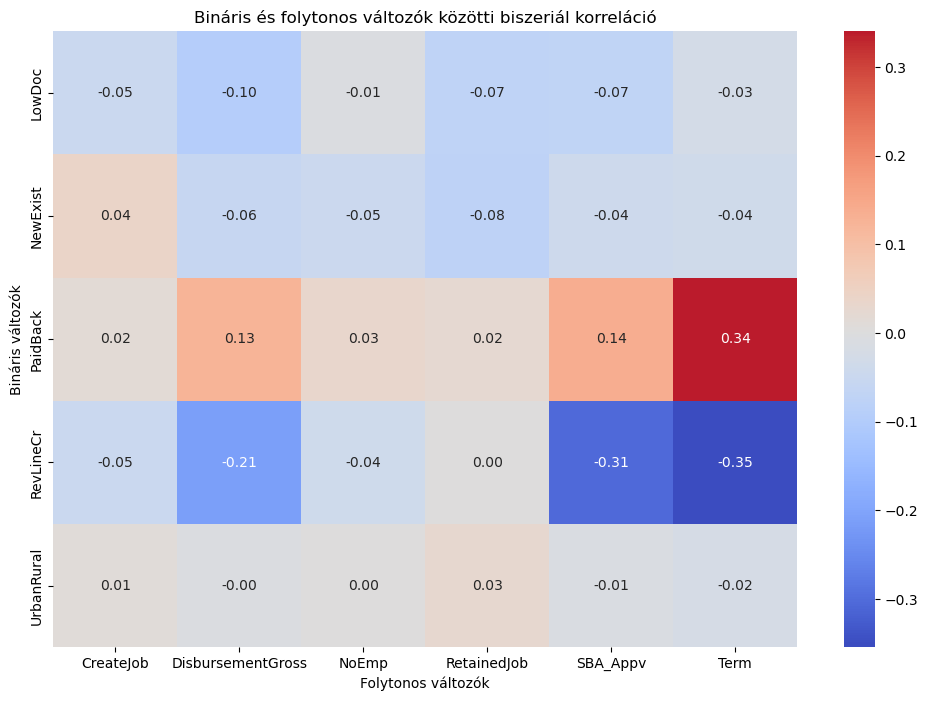

In [17]:
correlation_df = pd.DataFrame(correlation_data)
plt.figure(figsize=(12, 8))
correlation_matrix = correlation_df.pivot(index="Binary Variable", columns="Continuous Variable", values="Correlation Coefficient")
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", center=0, fmt=".2f")
plt.title("Bináris és folytonos változók közötti biszeriál korreláció")
plt.xlabel('Folytonos változók')
plt.ylabel('Bináris változók')
plt.show()

In [18]:
df_sba = df_sba.drop(columns=['CreateJob','NoEmp','RetainedJob'],axis=1)

In [19]:
describe_data(df_sba)

530630


,Column,type,unique sample,uniques,NaN%,Min,Max
0,State,object,"[NC, AR, CA, FL, LA]",51,0.0,NaN,NaN
1,NAICS,int64,"[44, 72, 61, 23, 53]",24,0.0,11.0,92.0
2,Term,int64,"[162, 126, 83, 84, 60]",337,0.0,0.0,569.0
3,NewExist,int64,"[1, 0]",2,0.0,0.0,1.0
4,UrbanRural,int64,"[1, 0]",2,0.0,0.0,1.0
5,RevLineCr,int64,"[0, 1]",2,0.0,0.0,1.0
6,LowDoc,int64,"[0, 1]",2,0.0,0.0,1.0
7,DisbursementGross,int64,"[253400, 137300, 438541, 51440, 50000]",102287,0.0,4000.0,11446325.0
8,SBA_Appv,int64,"[190050, 116705, 50000, 17500, 42500]",18817,0.0,500.0,4500000.0
9,PaidBack,int32,"[1, 0]",2,0.0,0.0,1.0


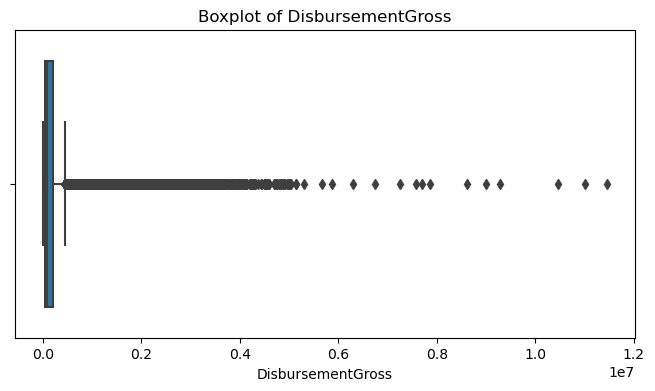

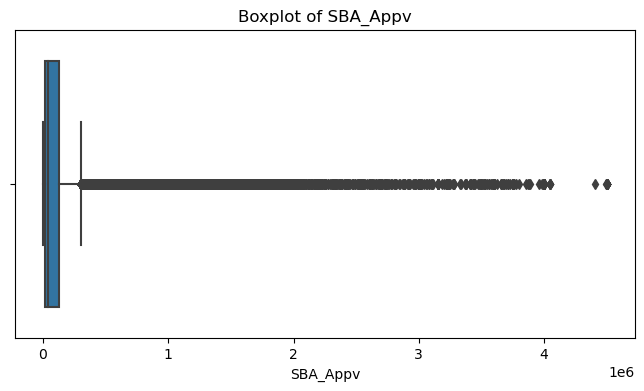

In [20]:
columns = ['DisbursementGross', 'SBA_Appv']
for col in columns:
    plt.figure(figsize=(8, 4))
    sns.boxplot(x=df_sba[col])
    plt.title(f'Boxplot of {col}')
    plt.show()

In [21]:
for col in columns:
    Q1=df_sba[col].quantile(0.25)
    Q3=df_sba[col].quantile(0.75)
    IQR=Q3-Q1
    lower_bound=Q1-1.5*IQR
    upper_bound=Q3+1.5*IQR
    df_sba = df_sba[(df_sba[col] >= lower_bound) & (df_sba[col] <= upper_bound)]

In [22]:
len(df_sba)

428075

In [23]:
df_sba.to_csv('data_for_learning.csv', index=False)

In [24]:
def makeplot(variable1, variable2, variable3):
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=variable1, y=variable2, hue=variable3)
    plt.title('Scatter plot by Paidback groups')
    plt.legend(title='Paidback')
    plt.grid(True)
    plt.show()

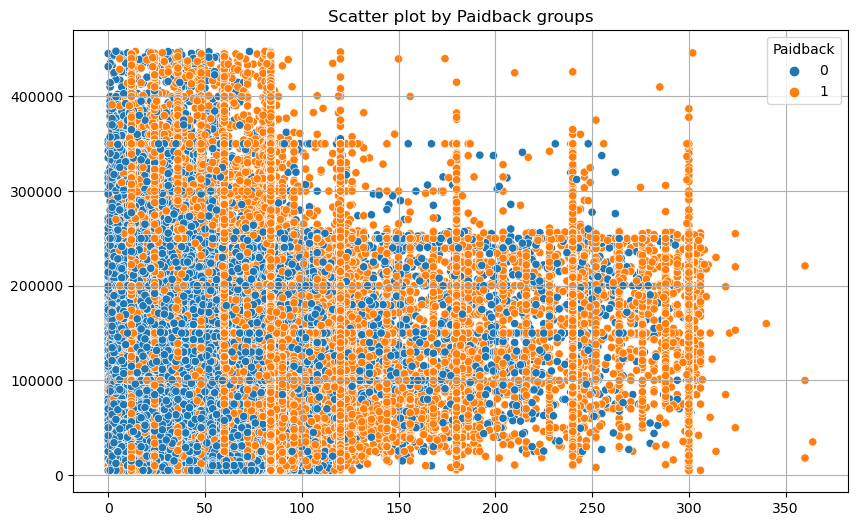

In [25]:
makeplot(df_sba['Term'].values, df_sba['DisbursementGross'].values , df_sba['PaidBack'].values)

In [26]:
df_sba

,State,NAICS,Term,NewExist,UrbanRural,RevLineCr,LowDoc,DisbursementGross,SBA_Appv,PaidBack
12,NC,44,162,1,1,0,0,253400,190050,1
24,AR,72,126,0,1,0,0,137300,116705,1
28,CA,61,83,1,1,1,0,438541,50000,1
30,FL,23,84,0,1,1,0,51440,17500,1
32,LA,53,60,0,1,0,0,50000,42500,1
...,...,...,...,...,...,...,...,...,...,...
863821,CO,61,84,0,0,1,0,30000,15000,1
863826,AZ,81,29,1,1,0,0,170000,127500,0
863834,AZ,51,84,0,1,1,0,15635,5000,1
865073,MT,32,107,0,0,0,0,170000,127500,0


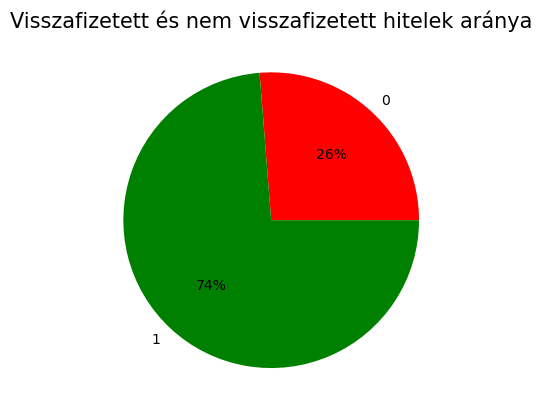

In [27]:
df_sba.groupby('PaidBack').size().plot(kind='pie', autopct='%1.f%%', colors=['red','green'])
plt.title('Visszafizetett és nem visszafizetett hitelek aránya',fontsize=15)
plt.show()

In [28]:
print(len(df_sba[df_sba.PaidBack==0]))
print(len(df_sba[df_sba.PaidBack==1]))

112386
315689


In [29]:
df_paidback_1 = df_sba[df_sba.PaidBack == 1]
df_paidback_1_sample = df_paidback_1.sample(n=len(df_sba[df_sba.PaidBack==0]), random_state=42)
df_paidback_0 = df_sba[df_sba.PaidBack == 0]
df_sba = pd.concat([df_paidback_0, df_paidback_1_sample])
print(df_sba['PaidBack'].value_counts())

PaidBack
0    112386
1    112386
Name: count, dtype: int64


### Standardizálás

In [30]:
numeric_feature_names = ['Term','DisbursementGross','SBA_Appv']
categoricial_feature_names = ['State','NAICS', 'NewExist','UrbanRural']

df_standardized = df_sba.copy()

ss = StandardScaler()
ss.fit(df_standardized[numeric_feature_names])
df_standardized[numeric_feature_names] = ss.transform(df_standardized[numeric_feature_names])
df_standardized = pd.get_dummies(df_standardized, columns=categoricial_feature_names)
categorical_engineered_features = list(set(df_standardized.columns) - set(numeric_feature_names))
print(categorical_engineered_features)

df_standardized

['State_NV', 'NAICS_31', 'State_ID', 'State_VA', 'State_HI', 'NAICS_61', 'NAICS_56', 'NAICS_23', 'NAICS_72', 'State_OR', 'State_MS', 'NAICS_48', 'NAICS_81', 'NAICS_92', 'State_NC', 'State_TN', 'State_AR', 'UrbanRural_0', 'RevLineCr', 'State_RI', 'State_WV', 'NAICS_55', 'State_UT', 'State_NM', 'State_NE', 'State_ND', 'LowDoc', 'State_DE', 'State_WI', 'State_MD', 'State_IL', 'NAICS_33', 'State_SC', 'State_ME', 'State_MA', 'State_NH', 'State_WA', 'State_NY', 'NAICS_44', 'NAICS_22', 'State_FL', 'State_MO', 'State_MI', 'State_VT', 'NAICS_11', 'NAICS_71', 'NAICS_21', 'State_AK', 'State_MN', 'UrbanRural_1', 'State_KS', 'State_CO', 'State_LA', 'NewExist_0', 'NAICS_49', 'State_CA', 'State_DC', 'NAICS_54', 'State_PA', 'NAICS_45', 'State_CT', 'State_OH', 'State_MT', 'State_SD', 'NAICS_53', 'State_NJ', 'State_GA', 'State_KY', 'State_OK', 'NAICS_62', 'State_IN', 'PaidBack', 'NAICS_52', 'NAICS_42', 'State_TX', 'State_IA', 'State_WY', 'State_AL', 'State_AZ', 'NAICS_51', 'NAICS_32', 'NewExist_1']


,Term,RevLineCr,LowDoc,DisbursementGross,SBA_Appv,PaidBack,State_AK,State_AL,State_AR,State_AZ,...,NAICS_61,NAICS_62,NAICS_71,NAICS_72,NAICS_81,NAICS_92,NewExist_0,NewExist_1,UrbanRural_0,UrbanRural_1
67,-0.929052,1,0,-0.244981,-0.710663,0,False,False,False,False,...,False,False,False,False,False,False,False,True,True,False
83,-1.413176,0,0,-0.718173,-0.390052,0,False,False,False,False,...,False,False,False,False,False,False,False,True,False,True
89,-0.283553,1,0,-0.020103,-0.596607,0,False,False,False,False,...,False,False,False,False,False,False,True,False,True,False
202,-0.905998,1,0,0.183301,-0.368495,0,False,False,False,False,...,False,False,False,False,False,False,True,False,False,True
208,-0.583249,0,0,-0.055222,0.496050,0,False,False,False,False,...,False,False,False,False,False,False,False,True,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
427991,-0.145232,1,0,-0.546190,-0.482551,1,False,False,False,False,...,False,False,False,False,False,False,True,False,False,True
115640,0.408053,1,0,-0.312229,-0.710663,1,False,False,False,False,...,False,False,False,False,True,False,True,False,False,True
804014,0.408053,0,0,-1.051597,-0.841828,1,False,False,False,False,...,False,False,False,False,False,False,False,True,False,True
536595,0.408053,0,0,-0.546190,-0.163194,1,False,False,False,False,...,False,False,False,False,False,False,True,False,False,True


### Minimum-maximum skálázás

In [31]:
df_normalized= df_sba.copy()
normalizer = MinMaxScaler()

df_normalized[numeric_feature_names] = normalizer.fit_transform(df_normalized[numeric_feature_names])
df_normalized = pd.get_dummies(df_normalized, columns=categoricial_feature_names)
categorical_engineered_features = list(set(df_normalized.columns) - set(numeric_feature_names))
print(categorical_engineered_features)
df_normalized

['State_NV', 'NAICS_31', 'State_ID', 'State_VA', 'State_HI', 'NAICS_61', 'NAICS_56', 'NAICS_23', 'NAICS_72', 'State_OR', 'State_MS', 'NAICS_48', 'NAICS_81', 'NAICS_92', 'State_NC', 'State_TN', 'State_AR', 'UrbanRural_0', 'RevLineCr', 'State_RI', 'State_WV', 'NAICS_55', 'State_UT', 'State_NM', 'State_NE', 'State_ND', 'LowDoc', 'State_DE', 'State_WI', 'State_MD', 'State_IL', 'NAICS_33', 'State_SC', 'State_ME', 'State_MA', 'State_NH', 'State_WA', 'State_NY', 'NAICS_44', 'NAICS_22', 'State_FL', 'State_MO', 'State_MI', 'State_VT', 'NAICS_11', 'NAICS_71', 'NAICS_21', 'State_AK', 'State_MN', 'UrbanRural_1', 'State_KS', 'State_CO', 'State_LA', 'NewExist_0', 'NAICS_49', 'State_CA', 'State_DC', 'NAICS_54', 'State_PA', 'NAICS_45', 'State_CT', 'State_OH', 'State_MT', 'State_SD', 'NAICS_53', 'State_NJ', 'State_GA', 'State_KY', 'State_OK', 'NAICS_62', 'State_IN', 'PaidBack', 'NAICS_52', 'NAICS_42', 'State_TX', 'State_IA', 'State_WY', 'State_AL', 'State_AZ', 'NAICS_51', 'NAICS_32', 'NewExist_1']


,Term,RevLineCr,LowDoc,DisbursementGross,SBA_Appv,PaidBack,State_AK,State_AL,State_AR,State_AZ,...,NAICS_61,NAICS_62,NAICS_71,NAICS_72,NAICS_81,NAICS_92,NewExist_0,NewExist_1,UrbanRural_0,UrbanRural_1
67,0.071429,1,0,0.128138,0.049165,0,False,False,False,False,...,False,False,False,False,False,False,False,True,True,False
83,0.013736,0,0,0.054289,0.121905,0,False,False,False,False,...,False,False,False,False,False,False,False,True,False,True
89,0.148352,1,0,0.163233,0.075042,0,False,False,False,False,...,False,False,False,False,False,False,True,False,True,False
202,0.074176,1,0,0.194978,0.126795,0,False,False,False,False,...,False,False,False,False,False,False,True,False,False,True
208,0.112637,0,0,0.157753,0.322940,0,False,False,False,False,...,False,False,False,False,False,False,False,True,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
427991,0.164835,1,0,0.081130,0.100919,1,False,False,False,False,...,False,False,False,False,False,False,True,False,False,True
115640,0.230769,1,0,0.117643,0.049165,1,False,False,False,False,...,False,False,False,False,True,False,True,False,False,True
804014,0.230769,0,0,0.002254,0.019407,1,False,False,False,False,...,False,False,False,False,False,False,False,True,False,True
536595,0.230769,0,0,0.081130,0.173373,1,False,False,False,False,...,False,False,False,False,False,False,True,False,False,True


### Skálázatlan adatok átalakítása

In [32]:
df_sba_dummies = pd.get_dummies(df_sba, columns=categoricial_feature_names)
categorical_engineered_features = list(set(df_sba_dummies.columns) - set(numeric_feature_names))
print(categorical_engineered_features)
df_sba_dummies

['State_NV', 'NAICS_31', 'State_ID', 'State_VA', 'State_HI', 'NAICS_61', 'NAICS_56', 'NAICS_23', 'NAICS_72', 'State_OR', 'State_MS', 'NAICS_48', 'NAICS_81', 'NAICS_92', 'State_NC', 'State_TN', 'State_AR', 'UrbanRural_0', 'RevLineCr', 'State_RI', 'State_WV', 'NAICS_55', 'State_UT', 'State_NM', 'State_NE', 'State_ND', 'LowDoc', 'State_DE', 'State_WI', 'State_MD', 'State_IL', 'NAICS_33', 'State_SC', 'State_ME', 'State_MA', 'State_NH', 'State_WA', 'State_NY', 'NAICS_44', 'NAICS_22', 'State_FL', 'State_MO', 'State_MI', 'State_VT', 'NAICS_11', 'NAICS_71', 'NAICS_21', 'State_AK', 'State_MN', 'UrbanRural_1', 'State_KS', 'State_CO', 'State_LA', 'NewExist_0', 'NAICS_49', 'State_CA', 'State_DC', 'NAICS_54', 'State_PA', 'NAICS_45', 'State_CT', 'State_OH', 'State_MT', 'State_SD', 'NAICS_53', 'State_NJ', 'State_GA', 'State_KY', 'State_OK', 'NAICS_62', 'State_IN', 'PaidBack', 'NAICS_52', 'NAICS_42', 'State_TX', 'State_IA', 'State_WY', 'State_AL', 'State_AZ', 'NAICS_51', 'NAICS_32', 'NewExist_1']


,Term,RevLineCr,LowDoc,DisbursementGross,SBA_Appv,PaidBack,State_AK,State_AL,State_AR,State_AZ,...,NAICS_61,NAICS_62,NAICS_71,NAICS_72,NAICS_81,NAICS_92,NewExist_0,NewExist_1,UrbanRural_0,UrbanRural_1
67,26,1,0,60859,10000,0,False,False,False,False,...,False,False,False,False,False,False,False,True,True,False
83,5,0,0,28090,24055,0,False,False,False,False,...,False,False,False,False,False,False,False,True,False,True
89,54,1,0,76432,15000,0,False,False,False,False,...,False,False,False,False,False,False,True,False,True,False
202,27,1,0,90518,25000,0,False,False,False,False,...,False,False,False,False,False,False,True,False,False,True
208,41,0,0,74000,62900,0,False,False,False,False,...,False,False,False,False,False,False,False,True,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
427991,60,1,0,40000,20000,1,False,False,False,False,...,False,False,False,False,False,False,True,False,False,True
115640,84,1,0,56202,10000,1,False,False,False,False,...,False,False,False,False,True,False,True,False,False,True
804014,84,0,0,5000,4250,1,False,False,False,False,...,False,False,False,False,False,False,False,True,False,True
536595,84,0,0,40000,34000,1,False,False,False,False,...,False,False,False,False,False,False,True,False,False,True


### Standardizált adatok szétválasztása tanító és teszt adathalmazra

In [33]:
X_s = df_standardized.drop(columns=['PaidBack'])
y_s = df_standardized['PaidBack']
X_train_s, X_test_s, y_train_s, y_test_s = train_test_split(X_s, y_s, test_size=0.2, random_state=42)
print("Tanító adatok mérete (X):", X_train_s.shape)
print("Teszt adatok mérete (X):", X_test_s.shape)
print("Tanító adatok mérete (y):", y_train_s.shape)
print("Teszt adatok mérete (y):", y_test_s.shape)

Tanító adatok mérete (X): (179817, 84)
Teszt adatok mérete (X): (44955, 84)
Tanító adatok mérete (y): (179817,)
Teszt adatok mérete (y): (44955,)


### Minimum-maximum skálázott adatok szétválasztása tanító és teszt adathalmazra

In [34]:
X_n = df_normalized.drop(columns=['PaidBack'])
y_n = df_normalized['PaidBack']
X_train_n, X_test_n, y_train_n, y_test_n = train_test_split(X_n, y_n, test_size=0.2, random_state=42)
print("Tanító adatok mérete (X):", X_train_n.shape)
print("Teszt adatok mérete (X):", X_test_n.shape)
print("Tanító adatok mérete (y):", y_train_n.shape)
print("Teszt adatok mérete (y):", y_test_n.shape)

Tanító adatok mérete (X): (179817, 84)
Teszt adatok mérete (X): (44955, 84)
Tanító adatok mérete (y): (179817,)
Teszt adatok mérete (y): (44955,)


### Skálázatlan adatok szétválasztása tanító és teszt adatokra

In [35]:
X_e = df_sba_dummies.drop(columns=['PaidBack'])
y_e = df_sba_dummies['PaidBack']
X_train_e, X_test_e, y_train_e, y_test_e = train_test_split(X_e, y_e, test_size=0.2, random_state=42)
print("Tanító adatok mérete (X):", X_train_e.shape)
print("Teszt adatok mérete (X):", X_test_e.shape)
print("Tanító adatok mérete (y):", y_train_e.shape)
print("Teszt adatok mérete (y):", y_test_e.shape)

Tanító adatok mérete (X): (179817, 84)
Teszt adatok mérete (X): (44955, 84)
Tanító adatok mérete (y): (179817,)
Teszt adatok mérete (y): (44955,)


## Logisztikus regresszor modell

In [36]:
start_time_spec=time.time()
lr_s = LogisticRegression(max_iter=1000)
model_s = lr_s.fit(X_train_s, y_train_s)
end_time_spec=time.time()
training_time_lr_s=end_time_spec-start_time_spec
start_time_spec=time.time()
lr_n = LogisticRegression(max_iter=1000)
model_n = lr_n.fit(X_train_n, y_train_n)
end_time_spec=time.time()
training_time_lr_n=end_time_spec-start_time_spec
start_time_spec=time.time()
lr_e = LogisticRegression(max_iter=1000)
model_e = lr_e.fit(X_train_e, y_train_e)
end_time_spec=time.time()
training_time_lr_e=end_time_spec-start_time_spec

training_time_lr = training_time_lr_e+training_time_lr_s+training_time_lr_n
print(f"A tanítási idő: {training_time_lr:.2f} másodperc")

A tanítási idő: 20.48 másodperc


In [37]:
y_pred_s = lr_s.predict(X_test_s)
y_pred_n = lr_n.predict(X_test_n)
y_pred_e = lr_e.predict(X_test_e)
cm_s_lr = confusion_matrix(y_test_s, y_pred_s)
cm_n_lr = confusion_matrix(y_test_n, y_pred_n)
cm_e_lr = confusion_matrix(y_test_e, y_pred_e)
accuracy_s_lr = accuracy_score(y_test_s, y_pred_s)
accuracy_n_lr = accuracy_score(y_test_n, y_pred_n)
accuracy_e_lr = accuracy_score(y_test_e, y_pred_e)
precision_s_lr = precision_score(y_test_s, y_pred_s, average='weighted')
precision_n_lr = precision_score(y_test_n, y_pred_n, average='weighted')
precision_e_lr = precision_score(y_test_e, y_pred_e, average='weighted')
recall_s_lr = recall_score(y_test_s, y_pred_s, average='weighted')
recall_n_lr = recall_score(y_test_n, y_pred_n, average='weighted')
recall_e_lr = recall_score(y_test_e, y_pred_e, average='weighted')
f1_s_lr = f1_score(y_test_s, y_pred_s, average='weighted')
f1_n_lr = f1_score(y_test_n, y_pred_n, average='weighted')
f1_e_lr = f1_score(y_test_e, y_pred_e, average='weighted')
mse_s_lr = mean_squared_error(y_test_s, y_pred_s)
mse_n_lr = mean_squared_error(y_test_n, y_pred_n)
mse_e_lr = mean_squared_error(y_test_e, y_pred_e)

y_proba_s = lr_s.predict_proba(X_test_s)[:, 1]
y_proba_n = lr_n.predict_proba(X_test_n)[:, 1]
y_proba_e = lr_e.predict_proba(X_test_e)[:, 1]
roc_auc_s_lr = roc_auc_score(y_test_s, y_proba_s)
roc_auc_n_lr = roc_auc_score(y_test_n, y_proba_n)
roc_auc_e_lr = roc_auc_score(y_test_e, y_proba_e)

print("Skálázatlan adatok")
print(classification_report(y_test_e, y_pred_e))
print("Standardizált adatok")
print(classification_report(y_test_s, y_pred_s))
print('Minimum-maximum skálázott adatok')
print(classification_report(y_test_n, y_pred_n))

Skálázatlan adatok
              precision    recall  f1-score   support

           0       0.75      0.30      0.43     22361
           1       0.56      0.90      0.69     22594

    accuracy                           0.60     44955
   macro avg       0.65      0.60      0.56     44955
weighted avg       0.65      0.60      0.56     44955

Standardizált adatok
              precision    recall  f1-score   support

           0       0.79      0.79      0.79     22361
           1       0.79      0.79      0.79     22594

    accuracy                           0.79     44955
   macro avg       0.79      0.79      0.79     44955
weighted avg       0.79      0.79      0.79     44955

Minimum-maximum skálázott adatok
              precision    recall  f1-score   support

           0       0.79      0.79      0.79     22361
           1       0.79      0.79      0.79     22594

    accuracy                           0.79     44955
   macro avg       0.79      0.79      0.79     44955
w

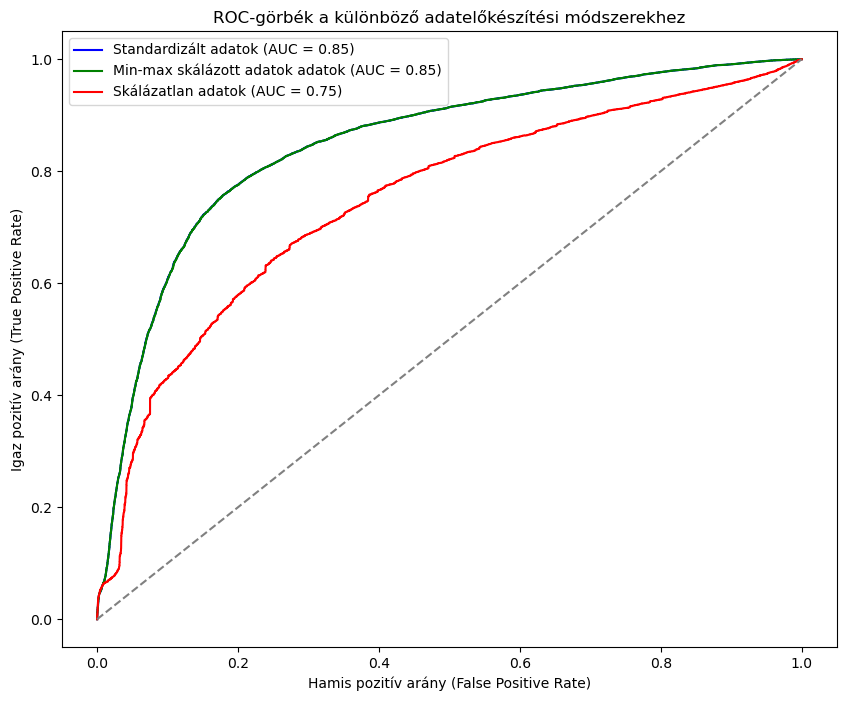

    Mérőszám  Skálázatlan adatok  Standardizált adatok  \
0   Accuracy            0.600489              0.787610   
1  Precision            0.654397              0.787609   
2     Recall            0.600489              0.787610   
3   F1 Score            0.560770              0.787608   
4        MSE            0.399511              0.212390   
5        AUC            0.746518              0.846857   

   Min-max skálázott adatok  
0                  0.787565  
1                  0.787564  
2                  0.787565  
3                  0.787564  
4                  0.212435  
5                  0.846809  


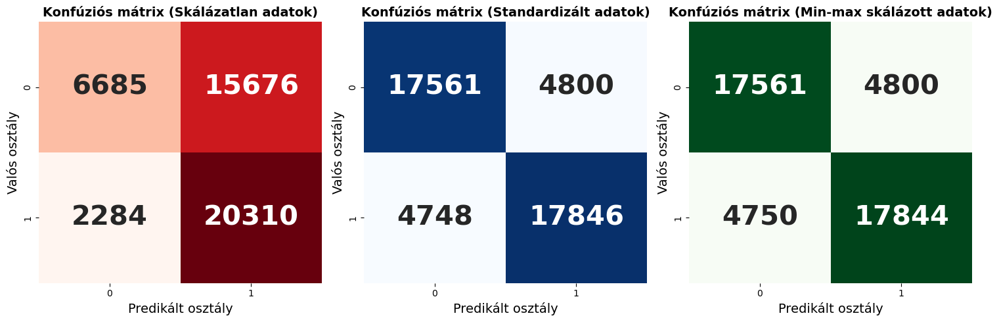

In [38]:
results = {
    "Mérőszám": ["Accuracy", "Precision", "Recall", "F1 Score", "MSE", "AUC"],
    "Skálázatlan adatok": [accuracy_e_lr, precision_e_lr, recall_e_lr, f1_e_lr, mse_e_lr, roc_auc_e_lr],
    "Standardizált adatok": [accuracy_s_lr, precision_s_lr, recall_s_lr, f1_s_lr, mse_s_lr, roc_auc_s_lr],
    "Min-max skálázott adatok": [accuracy_n_lr, precision_n_lr, recall_n_lr, f1_n_lr, mse_n_lr, roc_auc_n_lr]  
}

fpr_s, tpr_s, _ = roc_curve(y_test_s, y_proba_s)
fpr_n, tpr_n, _ = roc_curve(y_test_n, y_proba_n)
fpr_e, tpr_e, _ = roc_curve(y_test_e, y_proba_e)

plt.figure(figsize=(10, 8))
plt.plot(fpr_s, tpr_s, color='blue', label=f'Standardizált adatok (AUC = {roc_auc_s_lr:.2f})')
plt.plot(fpr_n, tpr_n, color='green', label=f'Min-max skálázott adatok adatok (AUC = {roc_auc_n_lr:.2f})')
plt.plot(fpr_e, tpr_e, color='red', label=f'Skálázatlan adatok (AUC = {roc_auc_e_lr:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.title('ROC-görbék a különböző adatelőkészítési módszerekhez')
plt.xlabel('Hamis pozitív arány (False Positive Rate)')
plt.ylabel('Igaz pozitív arány (True Positive Rate)')
plt.legend()
plt.show()


results_df = pd.DataFrame(results)
print(results_df)

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
sns.heatmap(cm_e_lr, annot=True, cmap='Reds', annot_kws={"size": 30, "fontweight": "bold"}, fmt='g',cbar=False)
plt.title('Konfúziós mátrix (Skálázatlan adatok)',fontsize=14, fontweight='bold')
plt.xlabel('Predikált osztály',fontsize=14)
plt.ylabel('Valós osztály',fontsize=14)

plt.subplot(1, 3, 2)
sns.heatmap(cm_s_lr, annot=True, cmap='Blues', annot_kws={"size": 30, "fontweight": "bold"}, fmt='g', cbar=False)
plt.title('Konfúziós mátrix (Standardizált adatok)', fontsize=14, fontweight='bold')
plt.xlabel('Predikált osztály',fontsize=14)
plt.ylabel('Valós osztály',fontsize=14)

plt.subplot(1, 3, 3)
sns.heatmap(cm_n_lr, annot=True, cmap='Greens', annot_kws={"size": 30, "fontweight": "bold"}, fmt='g', cbar=False)
plt.title('Konfúziós mátrix (Min-max skálázott adatok)', fontsize=14, fontweight='bold')
plt.xlabel('Predikált osztály',fontsize=14)
plt.ylabel('Valós osztály',fontsize=14)

plt.tight_layout()
plt.show()

## Döntési fa modell

In [39]:
start_time_spec=time.time()
decision_tree_s = DecisionTreeClassifier()
decision_tree_s.fit(X_train_s, y_train_s)
end_time_spec=time.time()
training_time_df_s=end_time_spec-start_time_spec

start_time_spec=time.time()
decision_tree_n = DecisionTreeClassifier()
decision_tree_n.fit(X_train_n, y_train_n)
end_time_spec=time.time()
training_time_df_n=end_time_spec-start_time_spec

start_time_spec=time.time()
decision_tree_e = DecisionTreeClassifier()
decision_tree_e.fit(X_train_e, y_train_e)
end_time_spec=time.time()
training_time_df_e=end_time_spec-start_time_spec

training_time_df = training_time_df_e+training_time_df_s+training_time_df_n
print(f"A tanítási idő: {training_time_df:.2f} másodperc\n")

y_pred_s = decision_tree_s.predict(X_test_s)
y_pred_n = decision_tree_n.predict(X_test_n)
y_pred_e = decision_tree_e.predict(X_test_e)

accuracy_s_df = accuracy_score(y_test_s, y_pred_s)
accuracy_n_df = accuracy_score(y_test_n, y_pred_n)
accuracy_e_df = accuracy_score(y_test_e, y_pred_e)

precision_s_df = precision_score(y_test_s, y_pred_s, average='weighted')
precision_n_df = precision_score(y_test_n, y_pred_n, average='weighted')
precision_e_df = precision_score(y_test_e, y_pred_e, average='weighted')

recall_s_df = recall_score(y_test_s, y_pred_s, average='weighted')
recall_n_df = recall_score(y_test_n, y_pred_n, average='weighted')
recall_e_df = recall_score(y_test_e, y_pred_e, average='weighted')

f1_s_df = f1_score(y_test_s, y_pred_s, average='weighted')
f1_n_df = f1_score(y_test_n, y_pred_n, average='weighted')
f1_e_df = f1_score(y_test_e, y_pred_e, average='weighted')

mse_s_df = mean_squared_error(y_test_s, y_pred_s)
mse_n_df = mean_squared_error(y_test_n, y_pred_n)
mse_e_df = mean_squared_error(y_test_e, y_pred_e)

y_proba_s = decision_tree_s.predict_proba(X_test_s)[:, 1]
y_proba_n = decision_tree_n.predict_proba(X_test_n)[:, 1]
y_proba_e = decision_tree_e.predict_proba(X_test_e)[:, 1]
roc_auc_s_df = roc_auc_score(y_test_s, y_proba_s)
roc_auc_n_df = roc_auc_score(y_test_n, y_proba_n)
roc_auc_e_df = roc_auc_score(y_test_e, y_proba_e)

print("Skálázatlan adatok")
print(classification_report(y_test_e, y_pred_e))
print("Standardizált adatok")
print(classification_report(y_test_s, y_pred_s))
print("Minimum-maximum skálázott adatok")
print(classification_report(y_test_n, y_pred_n))

results = {
    "Mérőszám": ["Accuracy", "Precision", "Recall", "F1 Score", "MSE", "AUC"],
    "Skálázatlan adatok": [accuracy_e_df, precision_e_df, recall_e_df, f1_e_df, mse_e_df, roc_auc_e_df],
    "Standardizált adatok": [accuracy_s_df, precision_s_df, recall_s_df, f1_s_df, mse_s_df, roc_auc_s_df],
    "Minimum-maximum skálázott adatok": [accuracy_n_df, precision_n_df, recall_n_df, f1_n_df, mse_n_df, roc_auc_n_df]   
}

results_df = pd.DataFrame(results)
print(results_df)

A tanítási idő: 14.35 másodperc

Skálázatlan adatok
              precision    recall  f1-score   support

           0       0.89      0.90      0.89     22361
           1       0.90      0.89      0.89     22594

    accuracy                           0.89     44955
   macro avg       0.89      0.89      0.89     44955
weighted avg       0.89      0.89      0.89     44955

Standardizált adatok
              precision    recall  f1-score   support

           0       0.89      0.90      0.90     22361
           1       0.90      0.89      0.90     22594

    accuracy                           0.90     44955
   macro avg       0.90      0.90      0.90     44955
weighted avg       0.90      0.90      0.90     44955

Minimum-maximum skálázott adatok
              precision    recall  f1-score   support

           0       0.89      0.90      0.90     22361
           1       0.90      0.89      0.90     22594

    accuracy                           0.90     44955
   macro avg       0.9

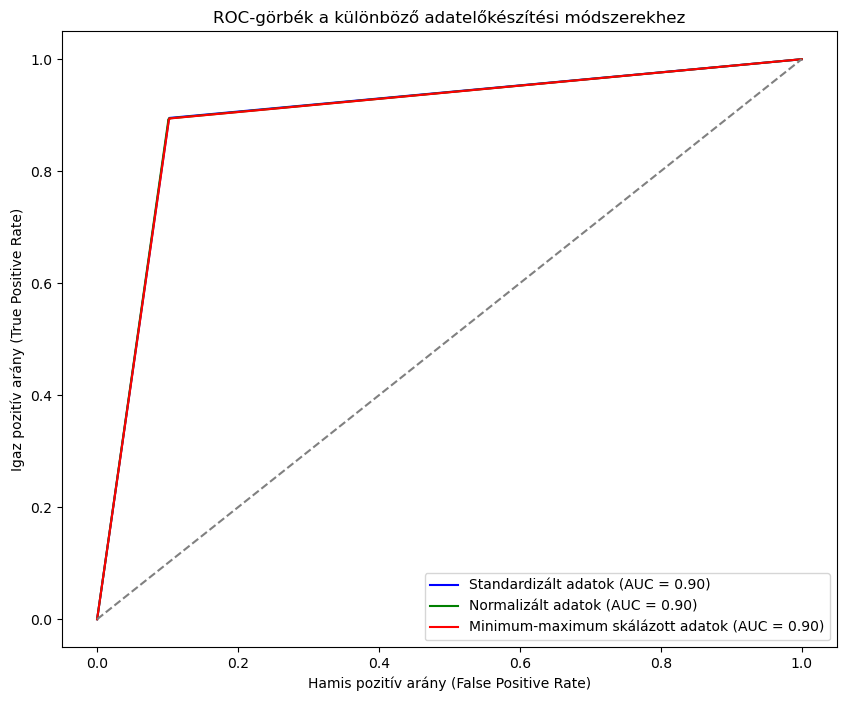

In [40]:
fpr_s, tpr_s, _ = roc_curve(y_test_s, y_proba_s)
fpr_n, tpr_n, _ = roc_curve(y_test_n, y_proba_n)
fpr_e, tpr_e, _ = roc_curve(y_test_e, y_proba_e)

plt.figure(figsize=(10, 8))
plt.plot(fpr_s, tpr_s, color='blue', label=f'Standardizált adatok (AUC = {roc_auc_s_df:.2f})')
plt.plot(fpr_n, tpr_n, color='green', label=f'Normalizált adatok (AUC = {roc_auc_n_df:.2f})')
plt.plot(fpr_e, tpr_e, color='red', label=f'Minimum-maximum skálázott adatok (AUC = {roc_auc_e_df:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.title('ROC-görbék a különböző adatelőkészítési módszerekhez')
plt.xlabel('Hamis pozitív arány (False Positive Rate)')
plt.ylabel('Igaz pozitív arány (True Positive Rate)')
plt.legend()
plt.show()

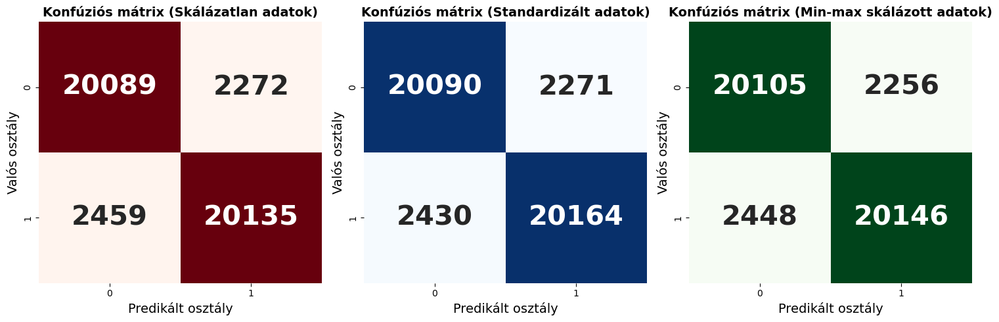

In [41]:
cm_s_df = confusion_matrix(y_test_s, y_pred_s)
cm_n_df = confusion_matrix(y_test_n, y_pred_n)
cm_e_df = confusion_matrix(y_test_e, y_pred_e)

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
sns.heatmap(cm_e_df, annot=True, cmap='Reds', annot_kws={"size": 30, "fontweight": "bold"}, fmt='g',cbar=False)
plt.title('Konfúziós mátrix (Skálázatlan adatok)',fontsize=14, fontweight='bold')
plt.xlabel('Predikált osztály',fontsize=14)
plt.ylabel('Valós osztály',fontsize=14)

plt.subplot(1, 3, 2)
sns.heatmap(cm_s_df, annot=True, cmap="Blues", fmt="d", annot_kws={"size": 30, "fontweight": "bold"},cbar=False)
plt.title('Konfúziós mátrix (Standardizált adatok)',fontsize=14, fontweight='bold')
plt.xlabel('Predikált osztály',fontsize=14)
plt.ylabel('Valós osztály',fontsize=14)

plt.subplot(1, 3, 3)
sns.heatmap(cm_n_df, annot=True, cmap="Greens", fmt="d", annot_kws={"size": 30, "fontweight": "bold"},cbar=False)
plt.title('Konfúziós mátrix (Min-max skálázott adatok)',fontsize=14, fontweight='bold')
plt.xlabel('Predikált osztály',fontsize=14)
plt.ylabel('Valós osztály',fontsize=14)

plt.tight_layout()
plt.show()

## Regularizált döntési fa

In [42]:
!pip install --user numpy==1.23.5

In [43]:
param_space = {
    'max_depth': Categorical([None, 5, 10, 15]),
    'min_samples_split': Integer(2, 5),
    'min_samples_leaf': Integer(1, 5),
    'ccp_alpha': Real(0.0, 0.01)
}

opt = BayesSearchCV(
    estimator=DecisionTreeClassifier(),
    search_spaces=param_space,
    n_iter=100,
    cv=5,
    scoring='accuracy',
    random_state=42,
    n_jobs=-1,
    return_train_score=True
)

start_time_spec=time.time()
opt.fit(X_train_s, y_train_s)
end_time_spec=time.time()
training_time_rdf_s=end_time_spec-start_time_spec

best_params = opt.best_params_
print("Legjobb paraméterek Standardizált adatokon:", best_params)
best_model_rdf_s = opt.best_estimator_
y_pred_s = best_model_rdf_s.predict(X_test_s)
print("Standardizált adatokon a legjobb modell értékelése:")
print(classification_report(y_test_s, y_pred_s))
accuracy_s_rdf = accuracy_score(y_test_s, y_pred_s)
precision_s_rdf = precision_score(y_test_s, y_pred_s, average='weighted')
recall_s_rdf = recall_score(y_test_s, y_pred_s, average='weighted')
f1_s_rdf = f1_score(y_test_s, y_pred_s, average='weighted')
mse_s_rdf = mean_squared_error(y_test_s, y_pred_s)
pd.set_option('display.max_colwidth', None)
pd.set_option('display.max_columns', None)
results = pd.DataFrame(opt.cv_results_)
results = results.sort_values(by='rank_test_score')
print("Paraméterkombinációk és rangsorolásuk táblázata Standardizált adatokon:")
print(results[['params', 'mean_test_score', 'rank_test_score']])

start_time_spec=time.time()
opt.fit(X_train_n, y_train_n)
end_time_spec=time.time()
training_time_rdf_n=end_time_spec-start_time_spec

best_params = opt.best_params_
print("Legjobb paraméterek Minimum-maximum skálázott adatokon:", best_params)
best_model_rdf_n = opt.best_estimator_
y_pred_n = best_model_rdf_n.predict(X_test_n)
print("Minimum-maximum skálázott adatokon a legjobb modell értékelése:")
print(classification_report(y_test_n, y_pred_n))
accuracy_n_rdf = accuracy_score(y_test_n, y_pred_n)
precision_n_rdf = precision_score(y_test_n, y_pred_n, average='weighted')
recall_n_rdf = recall_score(y_test_n, y_pred_n, average='weighted')
f1_n_rdf = f1_score(y_test_n, y_pred_n, average='weighted')
mse_n_rdf = mean_squared_error(y_test_n, y_pred_n)
results = pd.DataFrame(opt.cv_results_)
results = results.sort_values(by='rank_test_score')
print("Paraméterkombinációk és rangsorolásuk táblázata Minimum-maximum skálázott adatokon:")
print(results[['params', 'mean_test_score', 'rank_test_score']])

start_time_spec=time.time()
opt.fit(X_train_e, y_train_e)
end_time_spec=time.time()
training_time_rdf_e=end_time_spec-start_time_spec

best_params = opt.best_params_
print("Legjobb paraméterek Skálázatlan adatokon:", best_params)
best_model_rdf_e = opt.best_estimator_
y_pred_e = best_model_rdf_e.predict(X_test_e)
print("Skálázatlan adatokon a legjobb modell értékelése:")
print(classification_report(y_test_e, y_pred_e))
accuracy_e_rdf = accuracy_score(y_test_e, y_pred_e)
precision_e_rdf = precision_score(y_test_e, y_pred_e, average='weighted')
recall_e_rdf = recall_score(y_test_e, y_pred_e, average='weighted')
f1_e_rdf = f1_score(y_test_e, y_pred_e, average='weighted')
mse_e_rdf = mean_squared_error(y_test_e, y_pred_e)
results = pd.DataFrame(opt.cv_results_)
results = results.sort_values(by='rank_test_score')
print("Paraméterkombinációk és rangsorolásuk táblázata Skálázatlan adatokon:")
print(results[['params', 'mean_test_score', 'rank_test_score']])

training_time_rdf = training_time_rdf_s+training_time_rdf_n+training_time_rdf_e
print(f"A tanítási idő: {training_time_rdf:.2f} másodperc")


y_proba_s = best_model_rdf_s.predict_proba(X_test_s)[:, 1]
y_proba_n = best_model_rdf_n.predict_proba(X_test_n)[:, 1]
y_proba_e = best_model_rdf_e.predict_proba(X_test_e)[:, 1]
roc_auc_s_rdf = roc_auc_score(y_test_s, y_proba_s)
roc_auc_n_rdf = roc_auc_score(y_test_n, y_proba_n)
roc_auc_e_rdf = roc_auc_score(y_test_e, y_proba_e)

Legjobb paraméterek Standardizált adatokon: OrderedDict([('ccp_alpha', 2.5290342788396596e-05), ('max_depth', None), ('min_samples_leaf', 1), ('min_samples_split', 5)])
Standardizált adatokon a legjobb modell értékelése:
              precision    recall  f1-score   support

           0       0.91      0.94      0.93     22361
           1       0.94      0.91      0.92     22594

    accuracy                           0.92     44955
   macro avg       0.92      0.92      0.92     44955
weighted avg       0.93      0.92      0.92     44955

Paraméterkombinációk és rangsorolásuk táblázata Standardizált adatokon:
                                                                                                     params  \
49  {'ccp_alpha': 2.5290342788396596e-05, 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 5}   
22    {'ccp_alpha': 3.0150989468405733e-05, 'max_depth': 15, 'min_samples_leaf': 5, 'min_samples_split': 5}   
45    {'ccp_alpha': 2.6164494983911273e-05, 'ma

In [44]:
results = {
    "Mérőszám": ["Accuracy", "Precision", "Recall", "F1 Score", "MSE", "AUC"],
    "Skálázatlan adatok": [accuracy_e_rdf, precision_e_rdf, recall_e_rdf, f1_e_rdf, mse_e_rdf, roc_auc_e_rdf],
    "Standardizált adatok": [accuracy_s_rdf, precision_s_rdf, recall_s_rdf, f1_s_rdf, mse_s_rdf, roc_auc_s_rdf],
    "Minimum-maximum skálázott adatok": [accuracy_n_rdf, precision_n_rdf, recall_n_rdf, f1_n_rdf, mse_n_rdf, roc_auc_n_rdf]   
}
results_df = pd.DataFrame(results)
print(results_df)

    Mérőszám  Skálázatlan adatok  Standardizált adatok  \
0   Accuracy            0.925348              0.924791   
1  Precision            0.925639              0.925031   
2     Recall            0.925348              0.924791   
3   F1 Score            0.925340              0.924786   
4        MSE            0.074652              0.075209   
5        AUC            0.965674              0.965119   

   Minimum-maximum skálázott adatok  
0                          0.923524  
1                          0.923632  
2                          0.923524  
3                          0.923522  
4                          0.076476  
5                          0.964900  


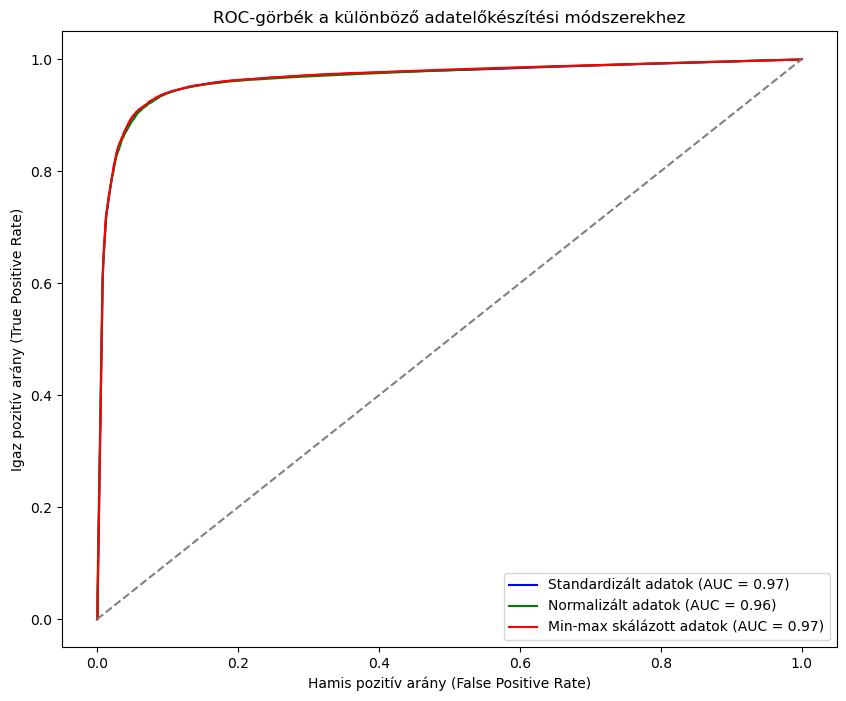

In [45]:
fpr_s, tpr_s, _ = roc_curve(y_test_s, y_proba_s)
fpr_n, tpr_n, _ = roc_curve(y_test_n, y_proba_n)
fpr_e, tpr_e, _ = roc_curve(y_test_e, y_proba_e)

plt.figure(figsize=(10, 8))
plt.plot(fpr_s, tpr_s, color='blue', label=f'Standardizált adatok (AUC = {roc_auc_s_rdf:.2f})')
plt.plot(fpr_n, tpr_n, color='green', label=f'Normalizált adatok (AUC = {roc_auc_n_rdf:.2f})')
plt.plot(fpr_e, tpr_e, color='red', label=f'Min-max skálázott adatok (AUC = {roc_auc_e_rdf:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.title('ROC-görbék a különböző adatelőkészítési módszerekhez')
plt.xlabel('Hamis pozitív arány (False Positive Rate)')
plt.ylabel('Igaz pozitív arány (True Positive Rate)')
plt.legend()
plt.show()

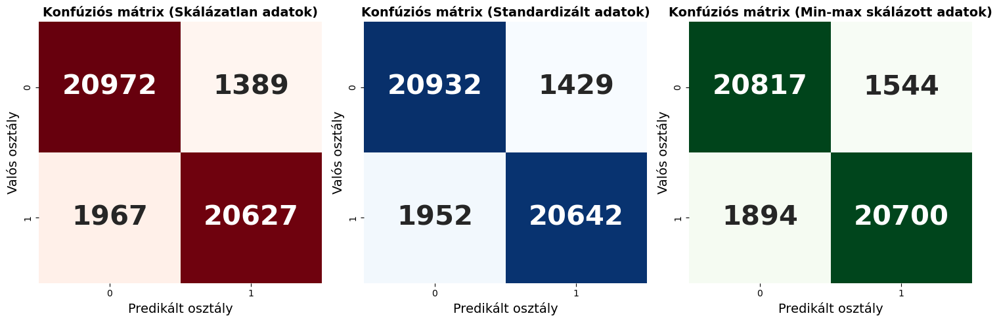

In [46]:
cm_s_rdf = confusion_matrix(y_test_s, y_pred_s)
cm_n_rdf = confusion_matrix(y_test_n, y_pred_n)
cm_e_rdf = confusion_matrix(y_test_e, y_pred_e)

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
sns.heatmap(cm_e_rdf, annot=True, cmap='Reds', annot_kws={"size": 30, "fontweight": "bold"}, fmt='g',cbar=False)
plt.title('Konfúziós mátrix (Skálázatlan adatok)',fontsize=14, fontweight='bold')
plt.xlabel('Predikált osztály',fontsize=14)
plt.ylabel('Valós osztály',fontsize=14)

plt.subplot(1, 3, 2)
sns.heatmap(cm_s_rdf, annot=True, cmap="Blues", fmt="d", annot_kws={"size": 30, "fontweight": "bold"},cbar=False)
plt.title('Konfúziós mátrix (Standardizált adatok)',fontsize=14, fontweight='bold')
plt.xlabel('Predikált osztály',fontsize=14)
plt.ylabel('Valós osztály',fontsize=14)

plt.subplot(1, 3, 3)
sns.heatmap(cm_n_rdf, annot=True, cmap="Greens", fmt="d", annot_kws={"size": 30, "fontweight": "bold"},cbar=False)
plt.title('Konfúziós mátrix (Min-max skálázott adatok)',fontsize=14, fontweight='bold')
plt.xlabel('Predikált osztály',fontsize=14)
plt.ylabel('Valós osztály',fontsize=14)

plt.tight_layout()
plt.show()

## Gradiens turbózás K-fold keresztvalidációval és korai leállással 

In [47]:
params_s = {
    'boosting_type': 'gbdt',
    'objective': 'binary', 
    'num_leaves': 31, 
    'max_bin': 255,
    'learning_rate': 0.1,
    'metric': ['binary_logloss', 'auc'],
    'bagging_fraction': 0.8,
    'bagging_freq': 5,
    'min_data_in_leaf': 1,
    'lambda_l1': 2.5290342788396596e-05,
    'min_samples_split': 5
}

params_n = {
    'boosting_type': 'gbdt',
    'objective': 'binary', 
    'num_leaves': 31, 
    'max_bin': 255,
    'learning_rate': 0.1,
    'metric': ['binary_logloss', 'auc'],
    'bagging_fraction': 0.8,
    'bagging_freq': 5,
    'min_data_in_leaf': 1,
    'lambda_l1': 4.22045208363775e-05,
    'min_samples_split': 2
}

params_e = {
    'boosting_type': 'gbdt',
    'objective': 'binary', 
    'num_leaves': 31, 
    'max_bin': 255,
    'learning_rate': 0.1,
    'metric': ['binary_logloss', 'auc'], 
    'bagging_fraction': 0.8,
    'bagging_freq': 5,
    'min_data_in_leaf': 2,
    'lambda_l1': 2.1290458632636793e-05,
    'min_samples_split': 5
}

In [48]:
def experiment(objective, label_type, x_train, x_test, y_train, y_test, params, i, fajl):
    lgb_train = lgb.Dataset(x_train, y_train, free_raw_data=False)
    lgb_test = lgb.Dataset(x_test, y_test, free_raw_data=False)    
    params['objective'] = objective
    fajlnev = f"{fajl}_gbmodel.txt"
    if i == 0:
        gbm = lgb.train(
            params=params, 
            train_set=lgb_train, 
            valid_sets=[lgb_train, lgb_test],
            num_boost_round=10
        ) 
        gbm.save_model(fajlnev)
    else:
        gbmprev = lgb.Booster(model_file=fajlnev) 
        gbm = lgb.train(
            params=params,
            train_set=lgb_train,
            valid_sets=[lgb_train, lgb_test],
            num_boost_round=10,
            init_model=gbmprev
        ) 
        gbm.save_model(fajlnev) 
      
    y_fitted = pd.Series(gbm.predict(x_test, num_iteration=gbm.best_iteration))
    y_pred = pd.DataFrame({'y_pred': y_fitted})
    y_true = pd.DataFrame({'y': y_test})
    return pd.concat([y_true.reset_index(drop=True), y_pred], axis=1)

In [49]:
num_folds = 5
kf = KFold(n_splits=num_folds, shuffle=True, random_state=42)
primary_target = 'binary'
tree_num = 100

def run_experiment(X, y, params, fajl):
    A = []
    accuracy = []
    previous_score = 0
    early_stopping_rounds = 5
    no_improvement = 0
    for fold, (train_index, test_index) in enumerate(kf.split(X)):
        print(f"Fold {fold + 1}/{num_folds}")
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        
        for k in range(tree_num):
            if no_improvement < early_stopping_rounds:
                result = experiment(primary_target, 'binary', X_train, X_test, y_train, y_test, params, k, fajl)
                A.append(result)
                current_score = accuracy_score(result['y'], result['y_pred'].round())
                accuracy.append({
                    'current': current_score,
                    'previous': previous_score,
                    'no_improvement': no_improvement,
                    'early_stopping_rounds': early_stopping_rounds,
                    'no_improvement_s < early_stopping_rounds': no_improvement < early_stopping_rounds
                })
                if current_score > previous_score:
                    previous_score = current_score
                    no_improvement = 0
                else:
                    no_improvement += 1
            else:
                print("Korai leállás")
                break

    return A, accuracy

start_time_spec=time.time()
A_s, accuracy_s = run_experiment(X_s, y_s, params_s, "s")
end_time_spec=time.time()
training_time_gt_s=end_time_spec-start_time_spec
start_time_spec=time.time()
A_n, accuracy_n = run_experiment(X_n, y_n, params_n, "n")
end_time_spec=time.time()
training_time_gt_n=end_time_spec-start_time_spec
start_time_spec=time.time()
A_e, accuracy_e = run_experiment(X_e, y_e, params_e, "e")
end_time_spec=time.time()
training_time_gt_e=end_time_spec-start_time_spec
end_time = time.time()
training_time_gt = training_time_gt_e+training_time_gt_s+training_time_gt_n

Fold 1/5
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Info] Number of positive: 89792, number of negative: 90025
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017317 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 916
[LightGBM] [Info] Number of data points in the train set: 179817, number of used features: 84
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499352 -> initscore=-0.002592
[LightGBM] [Info] Start training from score -0.002592
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] Unknown parame

[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Info] Number of positive: 89792, number of negative: 90025
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004468 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 916
[LightGBM] [Info] Number of data points in the train set: 179817, number of used features: 84
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [

[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Info] Number of positive: 89792, number of negative: 90025
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006794 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 916
[LightGBM] [Info] Number of data points in the train set: 179817, number of used features: 84
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [

[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Info] Number of positive: 89792, number of negative: 90025
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006186 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 916
[LightGBM] [Info] Number of data points in the train set: 179817, number of used features: 84
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [

[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Info] Number of positive: 89792, number of negative: 90025
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005058 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 916
[LightGBM] [Info] Number of data points in the train set: 179817, number of used features: 84
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [

[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Info] Number of positive: 89792, number of negative: 90025
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006948 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 916
[LightGBM] [Info] Number of data points in the train set: 179817, number of used features: 84
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [

[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Info] Number of positive: 89792, number of negative: 90025
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005573 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 916
[LightGBM] [Info] Number of data points in the train set: 179817, number of used features: 84
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [

[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Info] Number of positive: 89792, number of negative: 90025
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007049 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 916
[LightGBM] [Info] Number of data points in the train set: 179817, number of used features: 84
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [

[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Info] Number of positive: 89792, number of negative: 90025
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006617 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 916
[LightGBM] [Info] Number of data points in the train set: 179817, number of used features: 84
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [

[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Info] Number of positive: 89792, number of negative: 90025
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005326 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 916
[LightGBM] [Info] Number of data points in the train set: 179817, number of used features: 84
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [

In [50]:
print(f"A tanítási idő: {training_time_gt:.2f} másodperc")

A tanítási idő: 118.92 másodperc


Skálázatlan adatok


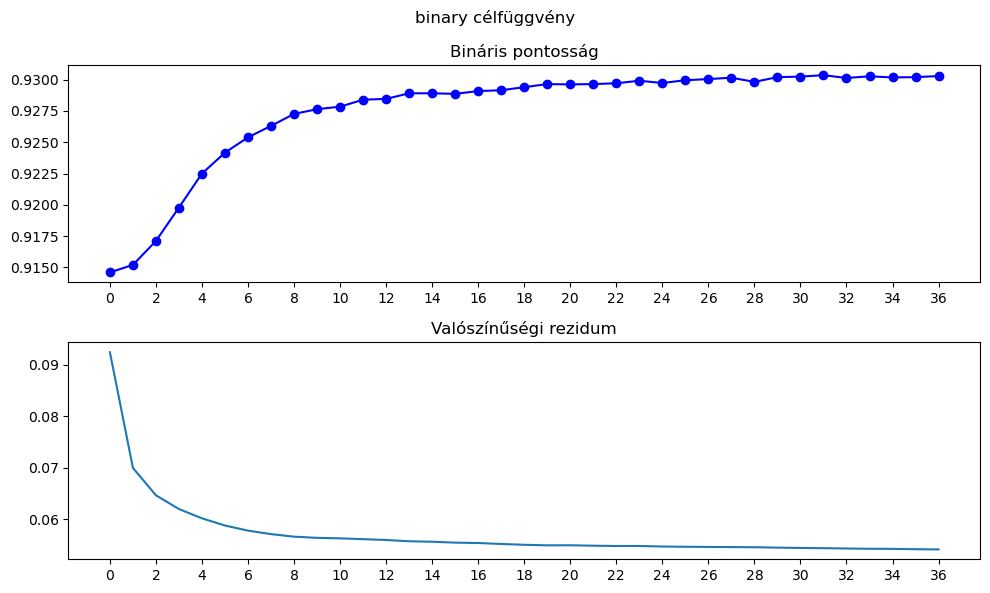

Standardizált adatok


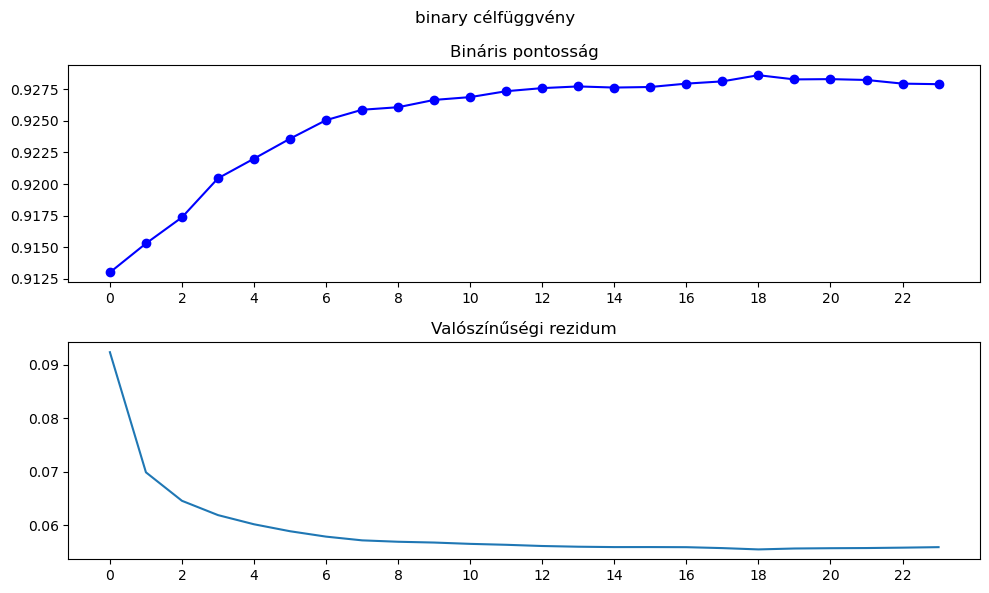

Minimum-maximum skálázott adatok


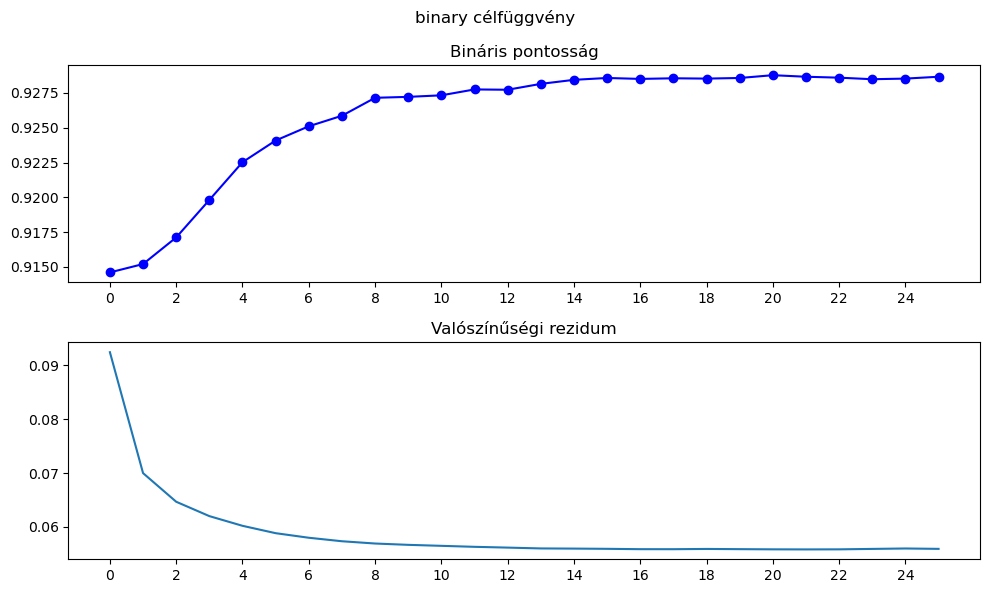

In [51]:
accuracy_binary = lambda D: [accuracy_score(x['y'], x['y_pred'].round()) for x in D]
accuracy_mean = lambda D: [mean_squared_error(x['y'], x['y_pred']) for x in D]

def accplot(accdata, objective):
    fig = plt.figure(figsize=(10,6))
    ax2 = fig.add_subplot(2,1,2)
    ax1 = fig.add_subplot(2,1,1, sharex=ax2) 
    fig.suptitle(objective + ' célfüggvény')
    ax1.plot(accuracy_binary(accdata), '-ob')
    ax1.set_title('Bináris pontosság')
    ax2.plot(accuracy_mean(accdata))
    ax2.set_title('Valószínűségi rezidum')
    ticks = np.arange(0, len(accdata))
    plt.xticks(ticks[::2], ticks[::2])
    plt.tight_layout()
    plt.show()
    
print('Skálázatlan adatok')
accplot(A_e, 'binary')
print('Standardizált adatok')
accplot(A_s, 'binary')
print('Minimum-maximum skálázott adatok')
accplot(A_n, 'binary')

In [52]:
print(len(A_e))
print(len(A_s))
print(len(A_n))

37
24
26


In [53]:
y_pred_binary_s = (A_s[-6]['y_pred']>= 0.5).astype(int)
y_pred_binary_n = (A_n[-6]['y_pred']>= 0.5).astype(int)
y_pred_binary_e = (A_e[-6]['y_pred']>= 0.5).astype(int)
y_real_s = A_s[-6]['y']
y_real_n = A_n[-6]['y']
y_real_e = A_e[-6]['y']
y_proba_s = A_s[-6]['y_pred'].values
y_proba_n = A_s[-6]['y_pred'].values
y_proba_e = A_s[-6]['y_pred'].values

accuracy_s_gt = accuracy_score(y_real_s, y_pred_binary_s)
accuracy_n_gt = accuracy_score(y_real_n, y_pred_binary_n)
accuracy_e_gt = accuracy_score(y_real_e, y_pred_binary_e)

precision_s_gt = precision_score(y_real_s, y_pred_binary_s, average='weighted')
precision_n_gt = precision_score(y_real_n,  y_pred_binary_n, average='weighted')
precision_e_gt = precision_score(y_real_e, y_pred_binary_e, average='weighted')

recall_s_gt = recall_score(y_real_s, y_pred_binary_s, average='weighted')
recall_n_gt = recall_score(y_real_n,  y_pred_binary_n, average='weighted')
recall_e_gt = recall_score(y_real_e, y_pred_binary_e, average='weighted')

f1_s_gt = f1_score(y_real_s, y_pred_binary_s, average='weighted')
f1_n_gt = f1_score(y_real_n, y_pred_binary_n, average='weighted')
f1_e_gt = f1_score(y_real_e, y_pred_binary_e, average='weighted')

mse_s_gt = mean_squared_error(y_real_s, y_pred_binary_s)
mse_n_gt = mean_squared_error(y_real_n, y_pred_binary_n)
mse_e_gt = mean_squared_error(y_real_e, y_pred_binary_e)

roc_auc_s_gt = roc_auc_score(y_test_s, y_proba_s)
roc_auc_n_gt = roc_auc_score(y_test_n, y_proba_n)
roc_auc_e_gt = roc_auc_score(y_test_e, y_proba_e)

results = {
    "Mérőszám": ["Accuracy", "Precision", "Recall", "F1 Score", "MSE", "AUC"],
    "Skálázatlan adatok": [accuracy_e_gt, precision_e_gt, recall_e_gt, f1_e_gt, mse_e_gt, roc_auc_e_gt],
    "Standardizált adatok": [accuracy_s_gt, precision_s_gt, recall_s_gt, f1_s_gt, mse_s_gt, roc_auc_s_gt],
    "Minimum-maximum skálázott adatok": [accuracy_n_gt, precision_n_gt, recall_n_gt, f1_n_gt, mse_n_gt, roc_auc_n_gt]   
}

results_df = pd.DataFrame(results)
print(results_df)

    Mérőszám  Skálázatlan adatok  Standardizált adatok  \
0   Accuracy            0.930353              0.928618   
1  Precision            0.930405              0.928676   
2     Recall            0.930353              0.928618   
3   F1 Score            0.930353              0.928617   
4        MSE            0.069647              0.071382   
5        AUC            0.496094              0.496094   

   Minimum-maximum skálázott adatok  
0                          0.928773  
1                          0.928817  
2                          0.928773  
3                          0.928773  
4                          0.071227  
5                          0.496094  


In [54]:
cm_s_gt = confusion_matrix(y_real_s, y_pred_binary_s)
cm_n_gt = confusion_matrix(y_real_n, y_pred_binary_n)
cm_e_gt = confusion_matrix(y_real_e, y_pred_binary_e)

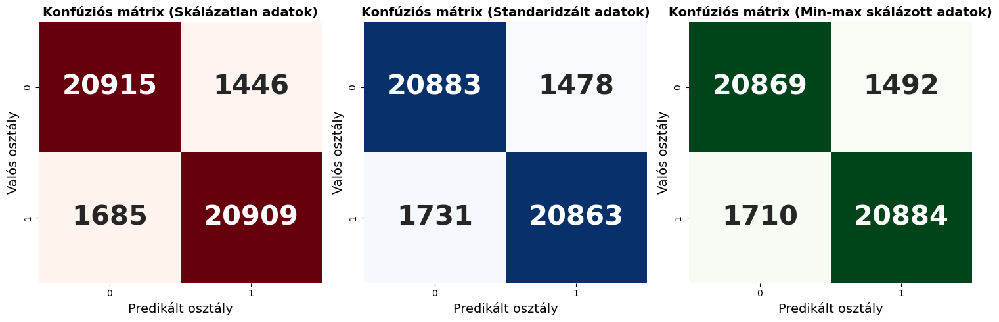

In [55]:
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
sns.heatmap(cm_e_gt, annot=True, cmap='Reds', annot_kws={"size": 30, "fontweight": "bold"}, fmt='g', cbar=False)
plt.title('Konfúziós mátrix (Skálázatlan adatok)',fontsize=14, fontweight='bold')
plt.xlabel('Predikált osztály',fontsize=14)
plt.ylabel('Valós osztály',fontsize=14)

plt.subplot(1, 3, 2)
sns.heatmap(cm_s_gt, annot=True, cmap="Blues", fmt="d", annot_kws={"size": 30, "fontweight": "bold"},cbar=False)
plt.title('Konfúziós mátrix (Standaridzált adatok)',fontsize=14, fontweight='bold')
plt.xlabel('Predikált osztály',fontsize=14)
plt.ylabel('Valós osztály',fontsize=14)

plt.subplot(1, 3, 3)
sns.heatmap(cm_n_gt, annot=True, cmap="Greens", fmt="d", annot_kws={"size": 30, "fontweight": "bold"},cbar=False)
plt.title('Konfúziós mátrix (Min-max skálázott adatok)',fontsize=14, fontweight='bold')
plt.xlabel('Predikált osztály',fontsize=14)
plt.ylabel('Valós osztály',fontsize=14)

plt.tight_layout()
plt.show()

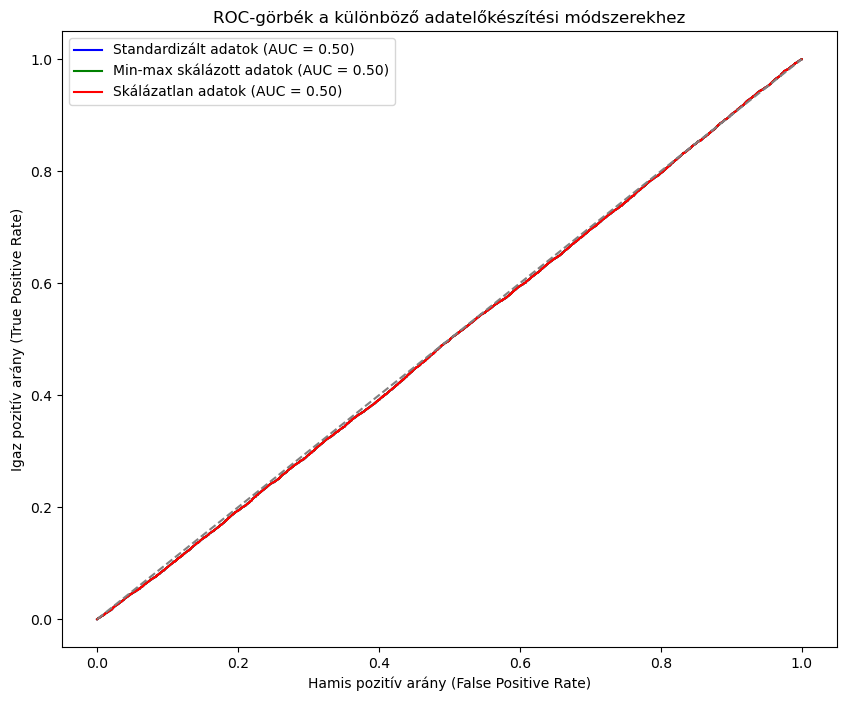

In [56]:
fpr_s, tpr_s, _ = roc_curve(y_test_s, y_proba_s)
fpr_n, tpr_n, _ = roc_curve(y_test_n, y_proba_n)
fpr_e, tpr_e, _ = roc_curve(y_test_e, y_proba_e)

plt.figure(figsize=(10, 8))
plt.plot(fpr_s, tpr_s, color='blue', label=f'Standardizált adatok (AUC = {roc_auc_s_gt:.2f})')
plt.plot(fpr_n, tpr_n, color='green', label=f'Min-max skálázott adatok (AUC = {roc_auc_n_gt:.2f})')
plt.plot(fpr_e, tpr_e, color='red', label=f'Skálázatlan adatok (AUC = {roc_auc_e_gt:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.title('ROC-görbék a különböző adatelőkészítési módszerekhez')
plt.xlabel('Hamis pozitív arány (False Positive Rate)')
plt.ylabel('Igaz pozitív arány (True Positive Rate)')
plt.legend()
plt.show()

## Neurális háló Keras

In [57]:
def check_and_convert_data(data):
    if not isinstance(data, np.ndarray):
        data = np.array(data)
    return data.astype(np.float32)

def create_and_train_model(X_train, y_train, X_test, y_test):
    num_classes = len(np.unique(y_train))
    y_train_cat = to_categorical(y_train, num_classes)
    y_test_cat = to_categorical(y_test, num_classes)
    
    model = Sequential()
    model.add(Dense(64, input_dim=X_train.shape[1], activation='relu'))
    model.add(Dense(64, activation='relu'))
    model.add(Dense(num_classes, activation='softmax'))
    
    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    model.fit(X_train, y_train_cat, epochs=50, batch_size=32, verbose=0)
    
    y_pred_prob = model.predict(X_test)
    y_pred = np.argmax(y_pred_prob, axis=1)
    
    return model, y_pred, y_pred_prob 

X_train_s = check_and_convert_data(X_train_s)
X_test_s = check_and_convert_data(X_test_s)
X_train_n = check_and_convert_data(X_train_n)
X_test_n = check_and_convert_data(X_test_n)
X_train_e = check_and_convert_data(X_train_e)
X_test_e = check_and_convert_data(X_test_e)

y_train_s = np.array(y_train_s)
y_test_s = np.array(y_test_s)
y_train_n = np.array(y_train_n)
y_test_n = np.array(y_test_n)
y_train_e = np.array(y_train_e)
y_test_e = np.array(y_test_e)

start_time_spec = time.time()
model_s, y_pred_s_nn, y_proba_s_nn = create_and_train_model(X_train_s, y_train_s, X_test_s, y_test_s)
end_time_spec = time.time()
training_time_nn_s = end_time_spec - start_time_spec

start_time_spec = time.time()
model_n, y_pred_n_nn, y_proba_n_nn = create_and_train_model(X_train_n, y_train_n, X_test_n, y_test_n)
end_time_spec = time.time()
training_time_nn_n = end_time_spec - start_time_spec

start_time_spec = time.time()
model_e, y_pred_e_nn, y_proba_e_nn = create_and_train_model(X_train_e, y_train_e, X_test_e, y_test_e)
end_time_spec = time.time()
training_time_nn_e = end_time_spec - start_time_spec

training_time_nn = training_time_nn_e + training_time_nn_s + training_time_nn_n
print(f"A tanítási idő: {training_time_nn:.2f} másodperc")

accuracy_s_nn = accuracy_score(y_test_s, y_pred_s_nn)
accuracy_n_nn = accuracy_score(y_test_n, y_pred_n_nn)
accuracy_e_nn = accuracy_score(y_test_e, y_pred_e_nn)

precision_s_nn = precision_score(y_test_s, y_pred_s_nn, average='weighted')
precision_n_nn = precision_score(y_test_n, y_pred_n_nn, average='weighted')
precision_e_nn = precision_score(y_test_e, y_pred_e_nn, average='weighted')

recall_s_nn = recall_score(y_test_s, y_pred_s_nn, average='weighted')
recall_n_nn = recall_score(y_test_n, y_pred_n_nn, average='weighted')
recall_e_nn = recall_score(y_test_e, y_pred_e_nn, average='weighted')

f1_s_nn = f1_score(y_test_s, y_pred_s_nn, average='weighted')
f1_n_nn = f1_score(y_test_n, y_pred_n_nn, average='weighted')
f1_e_nn = f1_score(y_test_e, y_pred_e_nn, average='weighted')

mse_s_nn = mean_squared_error(y_test_s, y_pred_s_nn)
mse_n_nn = mean_squared_error(y_test_n, y_pred_n_nn)
mse_e_nn = mean_squared_error(y_test_e, y_pred_e_nn)

y_test_s_cat = to_categorical(y_test_s, num_classes=len(np.unique(y_train_s)))
y_test_n_cat = to_categorical(y_test_n, num_classes=len(np.unique(y_train_n)))
y_test_e_cat = to_categorical(y_test_e, num_classes=len(np.unique(y_train_e)))


roc_auc_s_nn = roc_auc_score(y_test_s_cat, y_proba_s_nn, multi_class='ovr')
roc_auc_n_nn = roc_auc_score(y_test_n_cat, y_proba_n_nn, multi_class='ovr')
roc_auc_e_nn = roc_auc_score(y_test_e_cat, y_proba_e_nn, multi_class='ovr')

results = {
    "Mérőszám": ["Accuracy", "Precision", "Recall", "F1 Score", "MSE", "ROC AUC"],
    "Skálázatlan adatok": [accuracy_e_nn, precision_e_nn, recall_e_nn, f1_e_nn, mse_e_nn, roc_auc_e_nn],
    "Standardizált adatok": [accuracy_s_nn, precision_s_nn, recall_s_nn, f1_s_nn, mse_s_nn, roc_auc_s_nn],
    "Minimum-maximum skálázott adatok": [accuracy_n_nn, precision_n_nn, recall_n_nn, f1_n_nn, mse_n_nn, roc_auc_n_nn]   
}

results_df = pd.DataFrame(results)
print(results_df)


1405/1405 ━━━━━━━━━━━━━━━━━━━━ 1s 896us/step
1405/1405 ━━━━━━━━━━━━━━━━━━━━ 1s 998us/step
1405/1405 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
A tanítási idő: 923.33 másodperc
    Mérőszám  Skálázatlan adatok  Standardizált adatok  \
0   Accuracy            0.497409              0.887843   
1  Precision            0.247415              0.888421   
2     Recall            0.497409              0.887843   
3   F1 Score            0.330458              0.887814   
4        MSE            0.502591              0.112157   
5    ROC AUC            0.500000              0.946541   

   Minimum-maximum skálázott adatok  
0                          0.869736  
1                          0.869805  
2                          0.869736  
3                          0.869725  
4                          0.130264  
5                          0.938331  


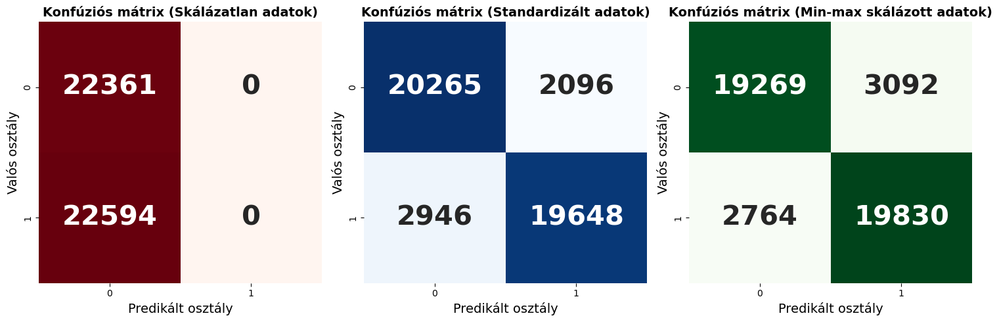

In [58]:
cm_s_nn = confusion_matrix(y_test_s, y_pred_s_nn)
cm_n_nn = confusion_matrix(y_test_n, y_pred_n_nn)
cm_e_nn = confusion_matrix(y_test_e, y_pred_e_nn)

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
sns.heatmap(cm_e_nn, annot=True, cmap='Reds', annot_kws={"size": 30, "fontweight": "bold"}, fmt='g', cbar=False)
plt.title('Konfúziós mátrix (Skálázatlan adatok)', fontsize=14, fontweight='bold')
plt.xlabel('Predikált osztály', fontsize=14)
plt.ylabel('Valós osztály', fontsize=14)

plt.subplot(1, 3, 2)
sns.heatmap(cm_s_nn, annot=True, cmap='Blues', annot_kws={"size": 30, "fontweight": "bold"}, fmt='g', cbar=False)
plt.title('Konfúziós mátrix (Standardizált adatok)', fontsize=14, fontweight='bold')
plt.xlabel('Predikált osztály', fontsize=14)
plt.ylabel('Valós osztály', fontsize=14)

plt.subplot(1, 3, 3)
sns.heatmap(cm_n_nn, annot=True, cmap='Greens', annot_kws={"size": 30, "fontweight": "bold"}, fmt='g', cbar=False)
plt.title('Konfúziós mátrix (Min-max skálázott adatok)', fontsize=14, fontweight='bold')
plt.xlabel('Predikált osztály', fontsize=14)
plt.ylabel('Valós osztály', fontsize=14)

plt.tight_layout()
plt.show()

In [59]:
y_proba_s_nn= np.argmax(y_proba_s_nn, axis=1)
y_proba_n_nn = np.argmax(y_proba_n_nn, axis=1)
y_proba_e_nn = np.argmax(y_proba_e_nn, axis=1)

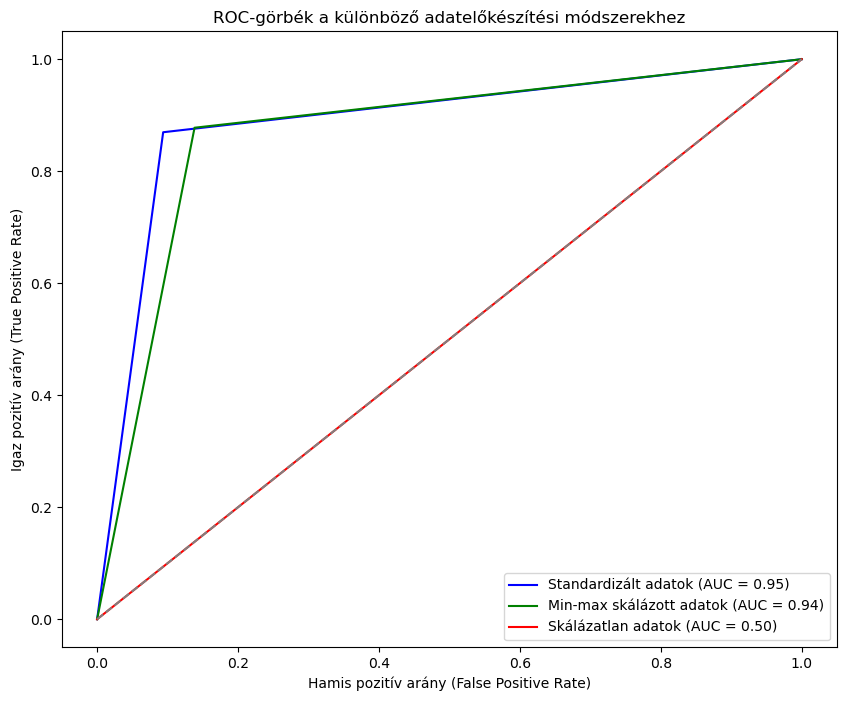

In [60]:
fpr_s, tpr_s, _ = roc_curve(y_test_s, y_proba_s_nn)
fpr_n, tpr_n, _ = roc_curve(y_test_n, y_proba_n_nn)
fpr_e, tpr_e, _ = roc_curve(y_test_e, y_proba_e_nn)

plt.figure(figsize=(10, 8))
plt.plot(fpr_s, tpr_s, color='blue', label=f'Standardizált adatok (AUC = {roc_auc_s_nn:.2f})')
plt.plot(fpr_n, tpr_n, color='green', label=f'Min-max skálázott adatok (AUC = {roc_auc_n_nn:.2f})')
plt.plot(fpr_e, tpr_e, color='red', label=f'Skálázatlan adatok (AUC = {roc_auc_e_nn:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.title('ROC-görbék a különböző adatelőkészítési módszerekhez')
plt.xlabel('Hamis pozitív arány (False Positive Rate)')
plt.ylabel('Igaz pozitív arány (True Positive Rate)')
plt.legend()
plt.show()

## Összegzés

In [61]:
valtozonevek = [
    "accuracy_e_nn", "precision_e_nn", "recall_e_nn", "f1_e_nn", "mse_e_nn", "roc_auc_e_nn",
    "accuracy_s_nn", "precision_s_nn", "recall_s_nn", "f1_s_nn", "mse_s_nn", "roc_auc_s_nn",
    "accuracy_n_nn", "precision_n_nn", "recall_n_nn", "f1_n_nn", "mse_n_nn", "roc_auc_n_nn",
    "accuracy_e_lr", "precision_e_lr", "recall_e_lr", "f1_e_lr", "mse_e_lr", "roc_auc_e_lr",
    "accuracy_s_lr", "precision_s_lr", "recall_s_lr", "f1_s_lr", "mse_s_lr", "roc_auc_s_lr",
    "accuracy_n_lr", "precision_n_lr", "recall_n_lr", "f1_n_lr", "mse_n_lr", "roc_auc_n_lr",
    "accuracy_e_df", "precision_e_df", "recall_e_df", "f1_e_df", "mse_e_df", "roc_auc_e_df",
    "accuracy_s_df", "precision_s_df", "recall_s_df", "f1_s_df", "mse_s_df", "roc_auc_s_df",
    "accuracy_n_df", "precision_n_df", "recall_n_df", "f1_n_df", "mse_n_df", "roc_auc_n_df",
    "accuracy_e_rdf", "precision_e_rdf", "recall_e_rdf", "f1_e_rdf", "mse_e_rdf", "roc_auc_e_rdf",
    "accuracy_s_rdf", "precision_s_rdf", "recall_s_rdf", "f1_s_rdf", "mse_s_rdf", "roc_auc_s_rdf",
    "accuracy_n_rdf", "precision_n_rdf", "recall_n_rdf", "f1_n_rdf", "mse_n_rdf", "roc_auc_n_rdf",
    "accuracy_e_gt", "precision_e_gt", "recall_e_gt", "f1_e_gt", "mse_e_gt", "roc_auc_e_gt",
    "accuracy_s_gt", "precision_s_gt", "recall_s_gt", "f1_s_gt", "mse_s_gt", "roc_auc_s_gt",
    "accuracy_n_gt", "precision_n_gt", "recall_n_gt", "f1_n_gt", "mse_n_gt", "roc_auc_n_gt"
]


model_mapping = {
    "lr": "Logisztikus regresszió",
    "df": "Döntési fa",
    "rdf": "Regularizált döntési fa",
    "gt": "Gradiens turbózás",
    "nn": "Neurális háló"
}

data = {
    "Mérőszám": [],
    "Adatelőkészítés": [],
    "Modell": [],
    "Érték": []
}

for valtozo in valtozonevek:
    ertek = eval(valtozo)
    parts = valtozo.split('_')
    if(parts[0]=='roc'):
        data["Mérőszám"].append("Roc Auc")
        parts.pop(0)
    else:
        data["Mérőszám"].append(parts[0].capitalize())
    data["Adatelőkészítés"].append("Skálázatlan" if parts[1] == "e" else "Standardizált" if parts[1] == "s" else "Min-max skálázott")
    data["Modell"].append(model_mapping[parts[2]])
    data["Érték"].append(ertek)


meroszamok = pd.DataFrame(data)
print(meroszamok)

     Mérőszám    Adatelőkészítés             Modell     Érték
0    Accuracy        Skálázatlan      Neurális háló  0.497409
1   Precision        Skálázatlan      Neurális háló  0.247415
2      Recall        Skálázatlan      Neurális háló  0.497409
3          F1        Skálázatlan      Neurális háló  0.330458
4         Mse        Skálázatlan      Neurális háló  0.502591
..        ...                ...                ...       ...
85  Precision  Min-max skálázott  Gradiens turbózás  0.928817
86     Recall  Min-max skálázott  Gradiens turbózás  0.928773
87         F1  Min-max skálázott  Gradiens turbózás  0.928773
88        Mse  Min-max skálázott  Gradiens turbózás  0.071227
89    Roc Auc  Min-max skálázott  Gradiens turbózás  0.496094

[90 rows x 4 columns]


In [62]:
meroszamok['Modell_Adat'] = meroszamok['Modell'] + ' - ' + meroszamok['Adatelőkészítés']

In [63]:
meroszamok.to_csv('meroszamok.csv', index=False, encoding='utf-8')

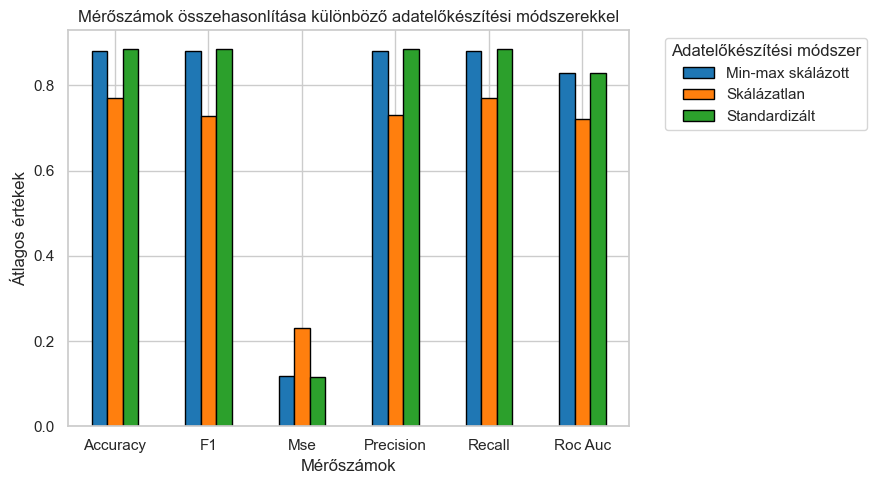

In [64]:
sns.set(style="whitegrid")
colors = sns.color_palette("tab10")
meroszamok.groupby(['Mérőszám', 'Adatelőkészítés'])['Érték'].mean().unstack().plot(kind='bar', color=colors, edgecolor='black')
plt.title('Mérőszámok összehasonlítása különböző adatelőkészítési módszerekkel')
plt.xlabel('Mérőszámok')
plt.xticks(rotation=0)
plt.ylabel('Átlagos értékek')
plt.legend(title='Adatelőkészítési módszer', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.gcf().set_size_inches(9, 5)
plt.tight_layout()
plt.show()

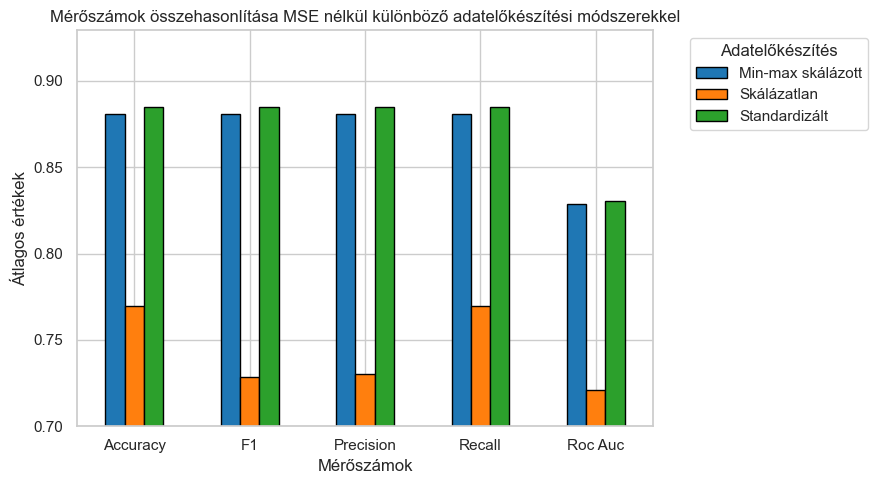

In [65]:
meroszamok[meroszamok['Mérőszám'] != 'Mse'].groupby(['Mérőszám', 'Adatelőkészítés'])['Érték'].mean().unstack().plot(kind='bar', color=colors, edgecolor='black')
plt.title('Mérőszámok összehasonlítása MSE nélkül különböző adatelőkészítési módszerekkel')
plt.xlabel('Mérőszámok')
plt.ylabel('Átlagos értékek')
plt.xticks(rotation=0)
plt.ylim(0.7, plt.ylim()[1])
plt.legend(title='Adatelőkészítés', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.gcf().set_size_inches(9, 5)
plt.tight_layout()
plt.show()

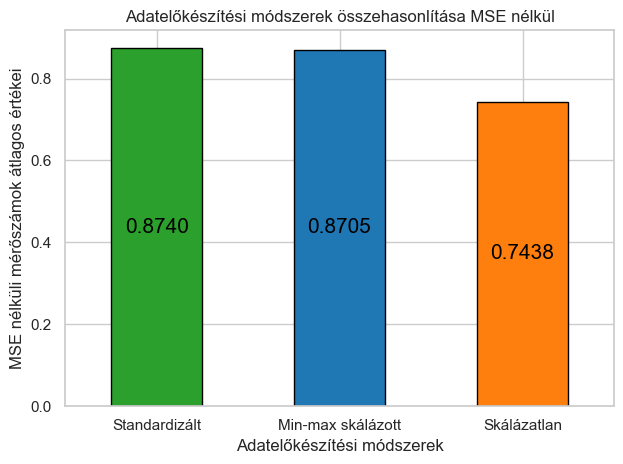

In [66]:
modszerek = meroszamok[meroszamok['Mérőszám'] != 'Mse'].groupby('Adatelőkészítés')['Érték'].mean().sort_values(ascending=False)
szinekjol = ['#2ca02c', '#1f77b4', '#ff7f0e' ]
bar_plot = modszerek.plot(kind='bar', color=szinekjol, edgecolor='black')
for index, value in enumerate(modszerek):
    plt.text(index, value / 2, f'{value:.4f}', ha='center', va='center', color='black', fontsize=15)
plt.title('Adatelőkészítési módszerek összehasonlítása MSE nélkül')
plt.xlabel('Adatelőkészítési módszerek')
plt.ylabel('MSE nélküli mérőszámok átlagos értékei')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

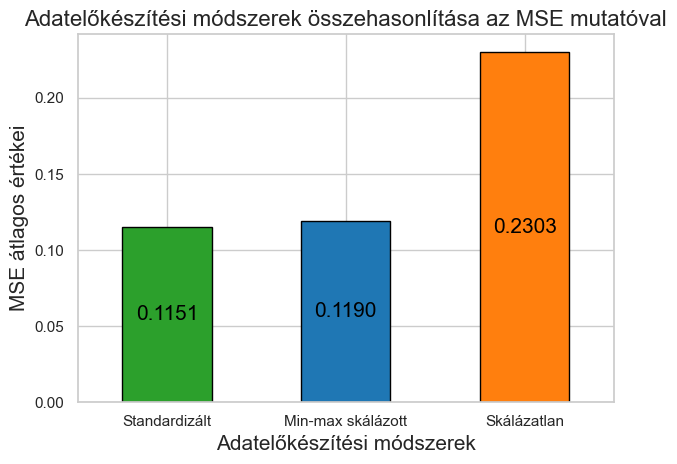

In [67]:
modszerek = meroszamok[meroszamok['Mérőszám'] == 'Mse'].groupby('Adatelőkészítés')['Érték'].mean().sort_values(ascending=True)
bar_plot = modszerek.plot(kind='bar', color=szinekjol, edgecolor='black')
for index, value in enumerate(modszerek):
    plt.text(index, value / 2, f'{value:.4f}', ha='center', va='center', color='black', fontsize=15)
plt.title('Adatelőkészítési módszerek összehasonlítása az MSE mutatóval', fontsize=16)
plt.xlabel('Adatelőkészítési módszerek',fontsize=15)
plt.ylabel('MSE átlagos értékei',fontsize=15)
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

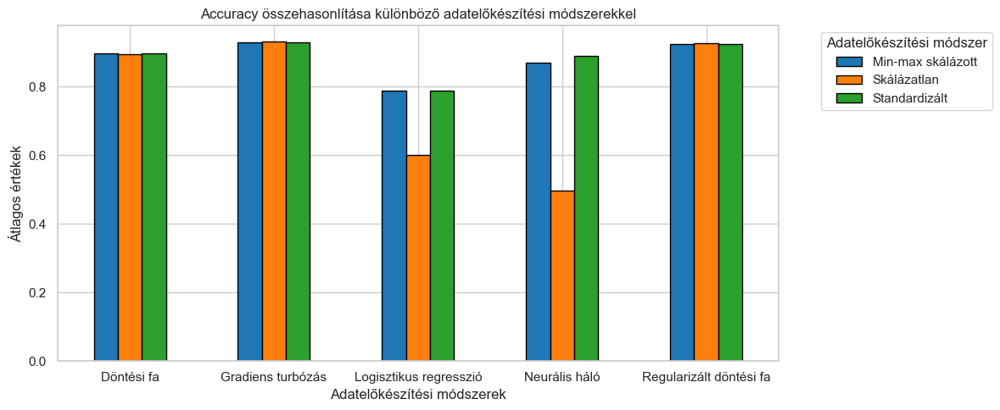

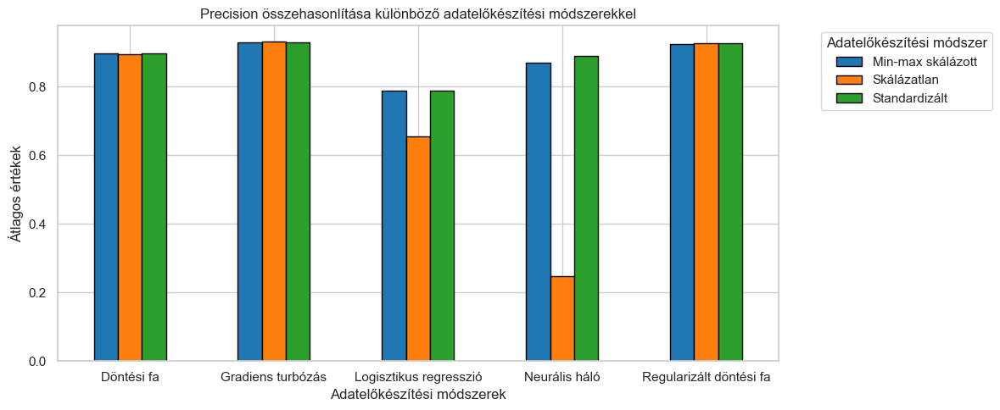

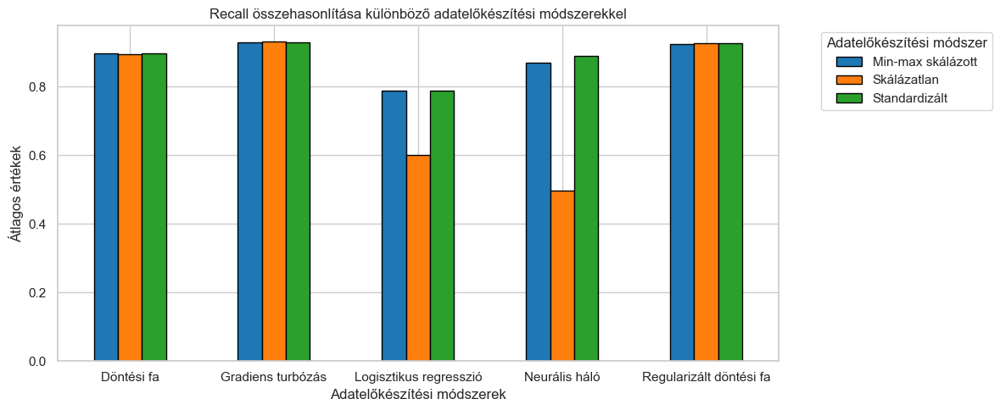

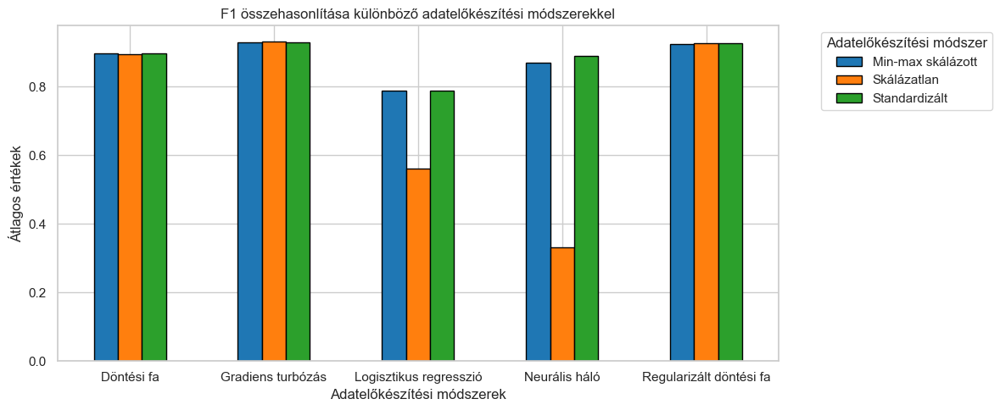

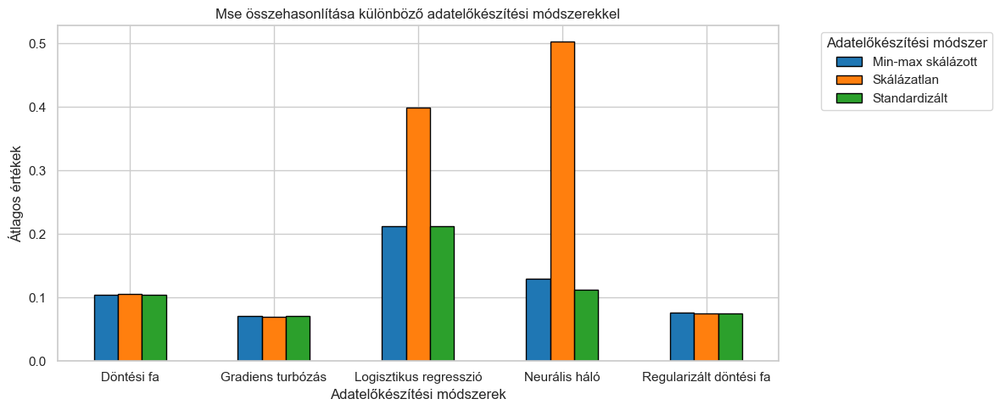

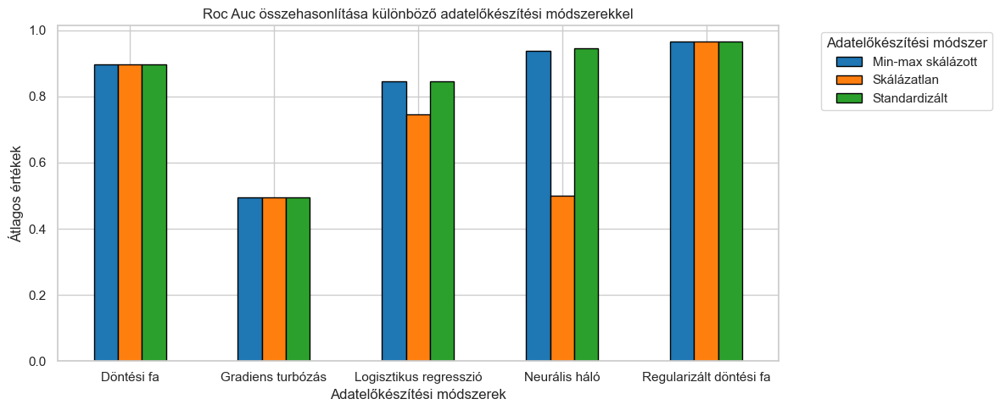

In [68]:
meroszamok_lista = meroszamok['Mérőszám'].unique()

for meroszam in meroszamok_lista:
    adatok = meroszamok[meroszamok['Mérőszám'] == meroszam]
    atlagok = adatok.groupby(['Modell','Adatelőkészítés'])['Érték'].mean().unstack()
    atlagok.plot(kind='bar', color=colors, edgecolor='black')
    plt.title(f'{meroszam} összehasonlítása különböző adatelőkészítési módszerekkel')
    plt.xlabel('Adatelőkészítési módszerek')
    plt.ylabel('Átlagos értékek')
    plt.legend(title='Adatelőkészítési módszer', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.xticks(rotation=0)
    plt.gcf().set_size_inches(12, 5)
    plt.tight_layout()
    plt.show()


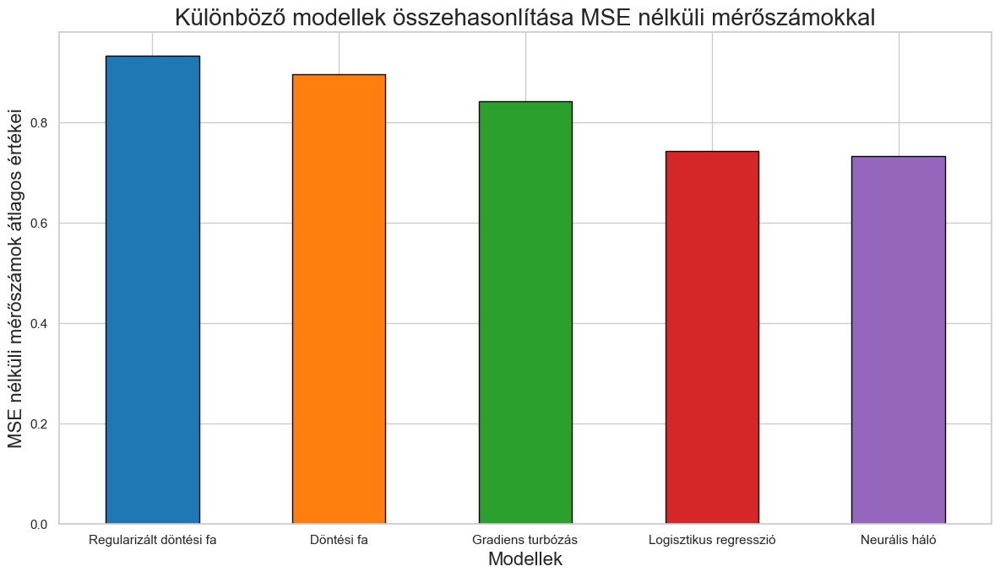

In [69]:
plt.figure(figsize=(10,5))
meroszamok[meroszamok['Mérőszám'] != 'Mse'].groupby(['Modell'])['Érték'].mean().sort_values(ascending=False).plot(kind='bar', color=colors, edgecolor='black')
plt.title('Különböző modellek összehasonlítása MSE nélküli mérőszámokkal', fontsize=20)
plt.xlabel('Modellek',fontsize=16)
plt.xticks(rotation=0)
plt.ylabel('MSE nélküli mérőszámok átlagos értékei', fontsize=16)
plt.gcf().set_size_inches(12, 7)
plt.tight_layout()
plt.show()

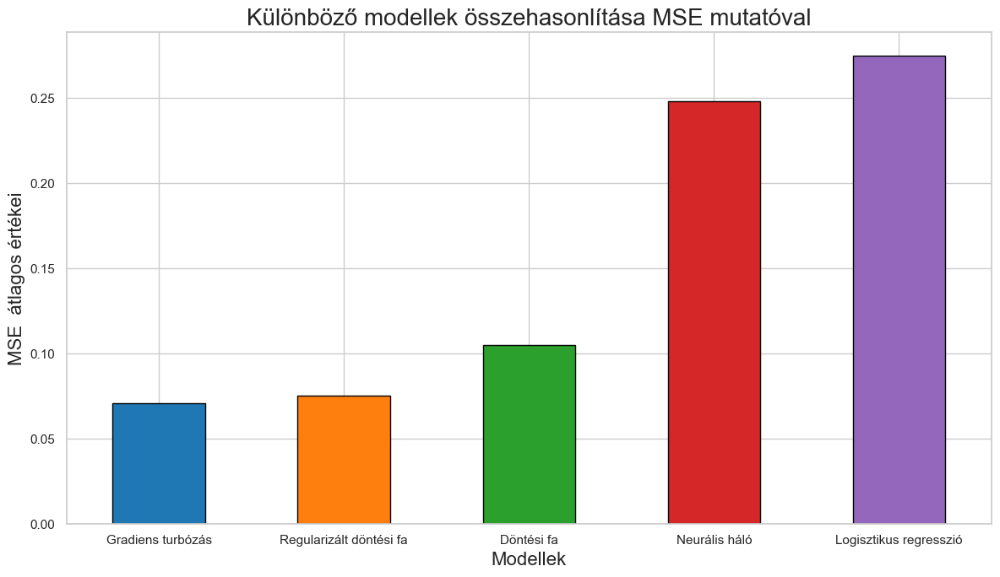

In [70]:
plt.figure(figsize=(10,5))
meroszamok[meroszamok['Mérőszám'] == 'Mse'].groupby(['Modell'])['Érték'].mean().sort_values(ascending=True).plot(kind='bar', color=colors, edgecolor='black')
plt.title('Különböző modellek összehasonlítása MSE mutatóval', fontsize=20)
plt.xlabel('Modellek',fontsize=16)
plt.xticks(rotation=0)
plt.ylabel('MSE  átlagos értékei',fontsize=16)
plt.gcf().set_size_inches(12, 7)
plt.tight_layout()
plt.show()

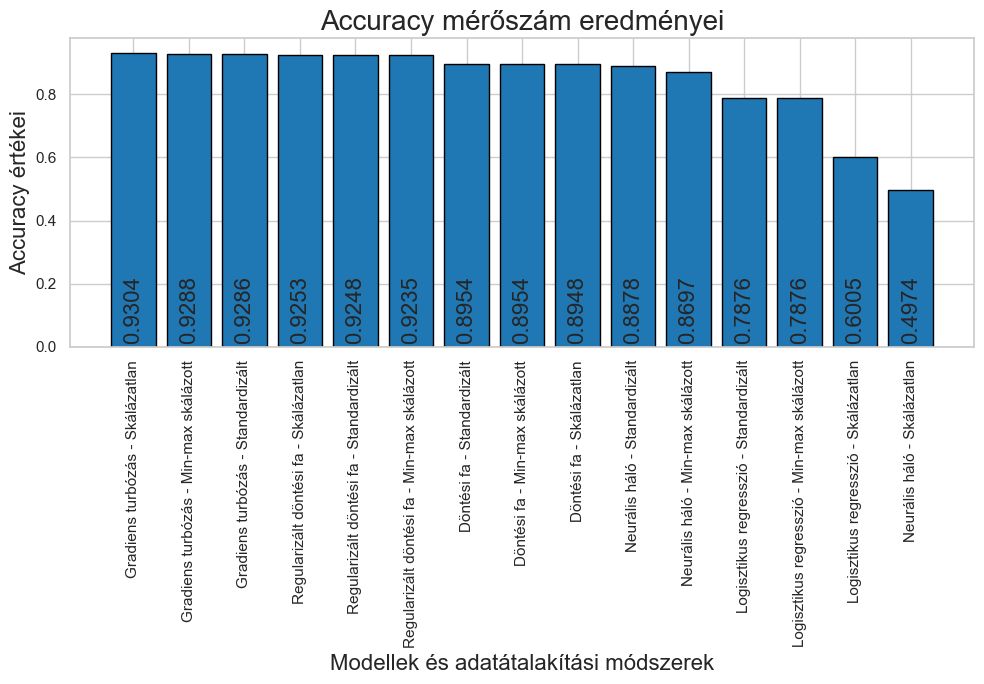

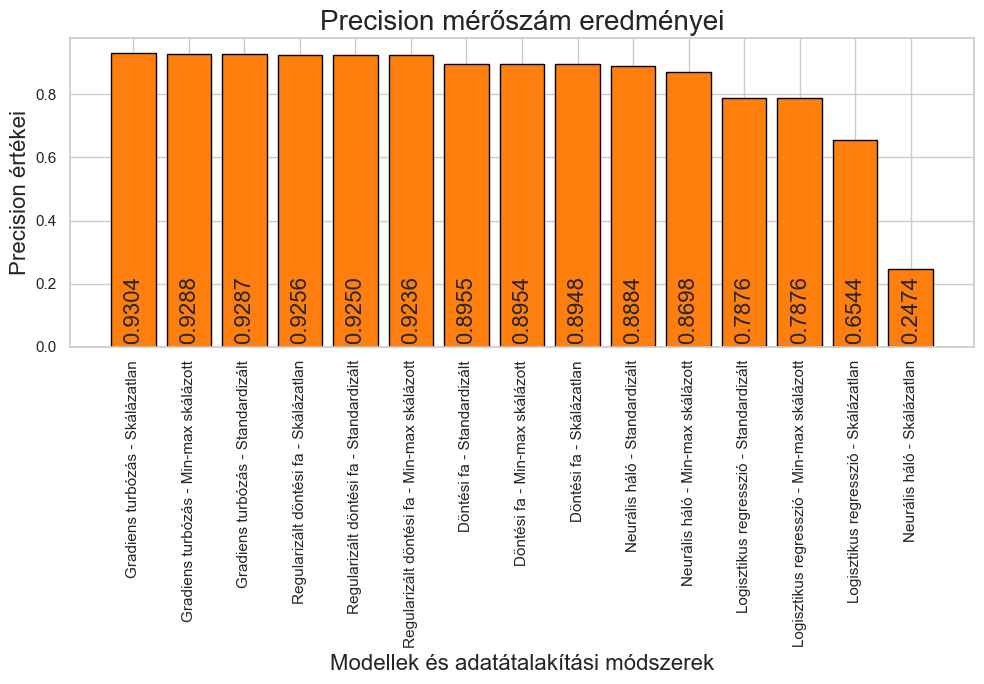

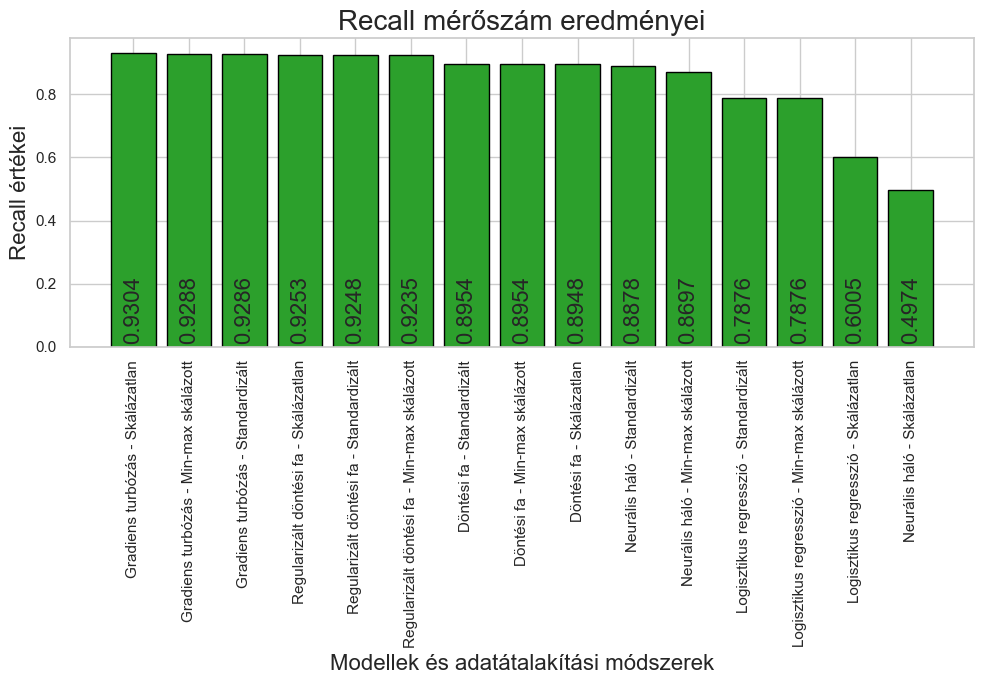

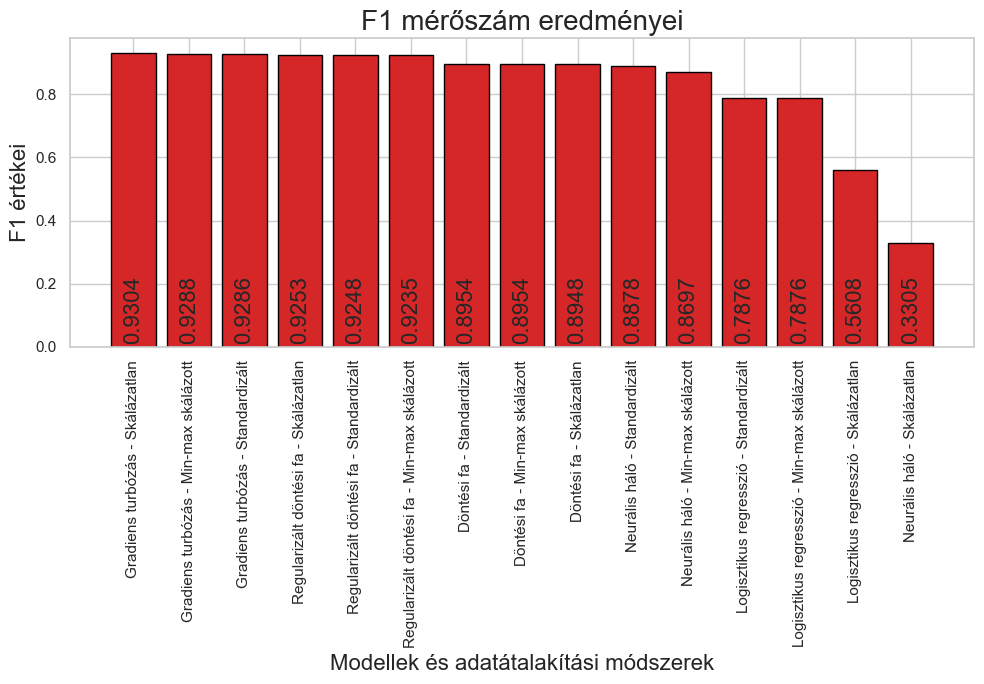

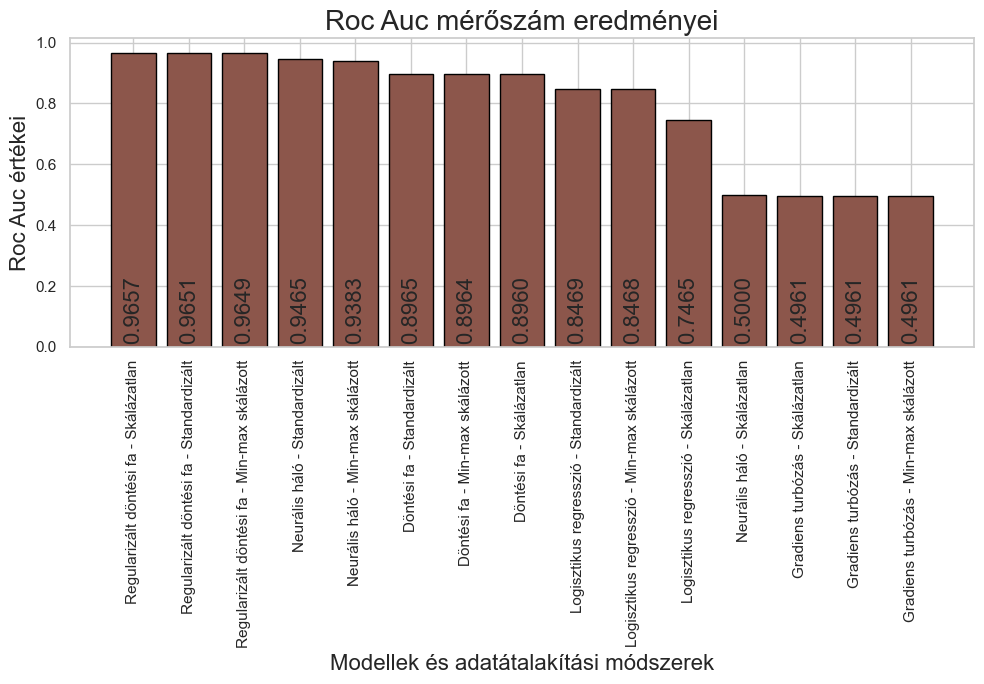

In [71]:
meroszamok_list = meroszamok['Mérőszám'].unique()
for i, meroszam in enumerate(meroszamok_list):
    if meroszam != 'Mse':
        data = meroszamok[meroszamok['Mérőszám'] == meroszam].sort_values('Érték', ascending=False)
        plt.figure(figsize=(10, 7))
        bars = plt.bar(data['Modell_Adat'], data['Érték'], color=colors[i % len(colors)], edgecolor='black')
        for bar in bars:
            yval = bar.get_height()
            plt.text(bar.get_x() + bar.get_width()/2, 0.01, f'{yval:.4f}', ha='center', va='bottom', rotation=90, fontsize=16)
        plt.title(f'{meroszam} mérőszám eredményei', fontsize=20)
        plt.xlabel('Modellek és adatátalakítási módszerek', fontsize=16)
        plt.xticks(rotation=90)
        plt.ylabel(f'{meroszam} értékei', fontsize=16)
        plt.tight_layout()
        plt.show()


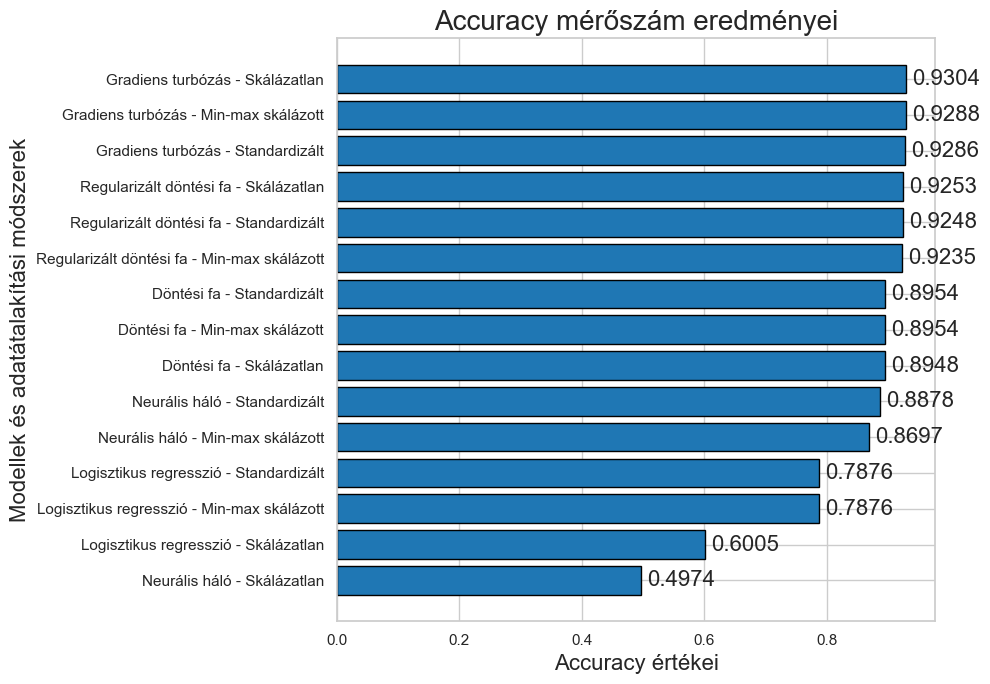

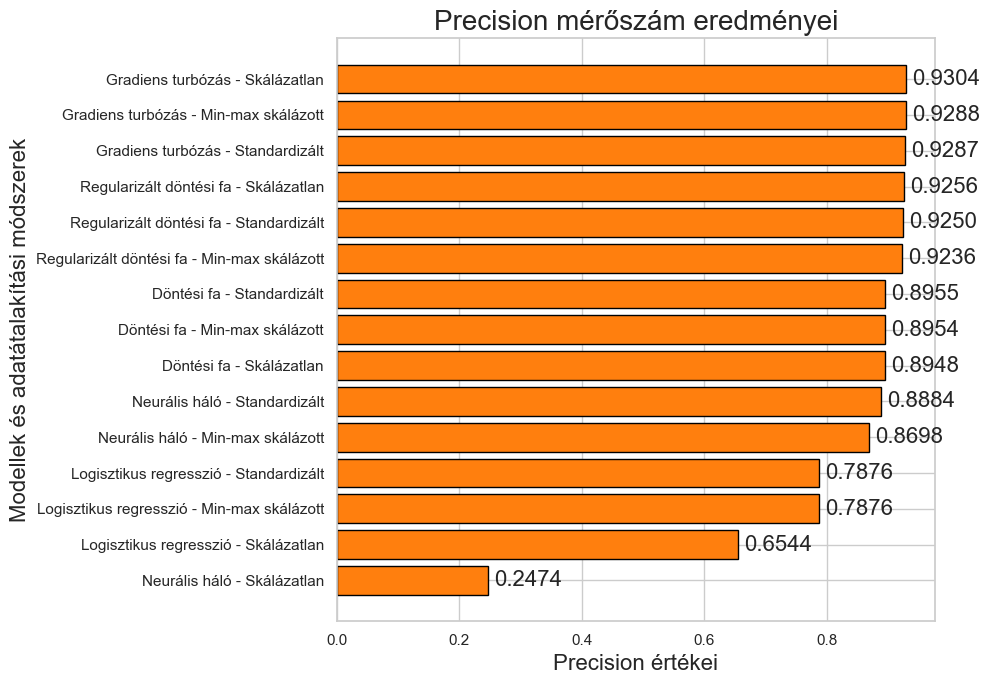

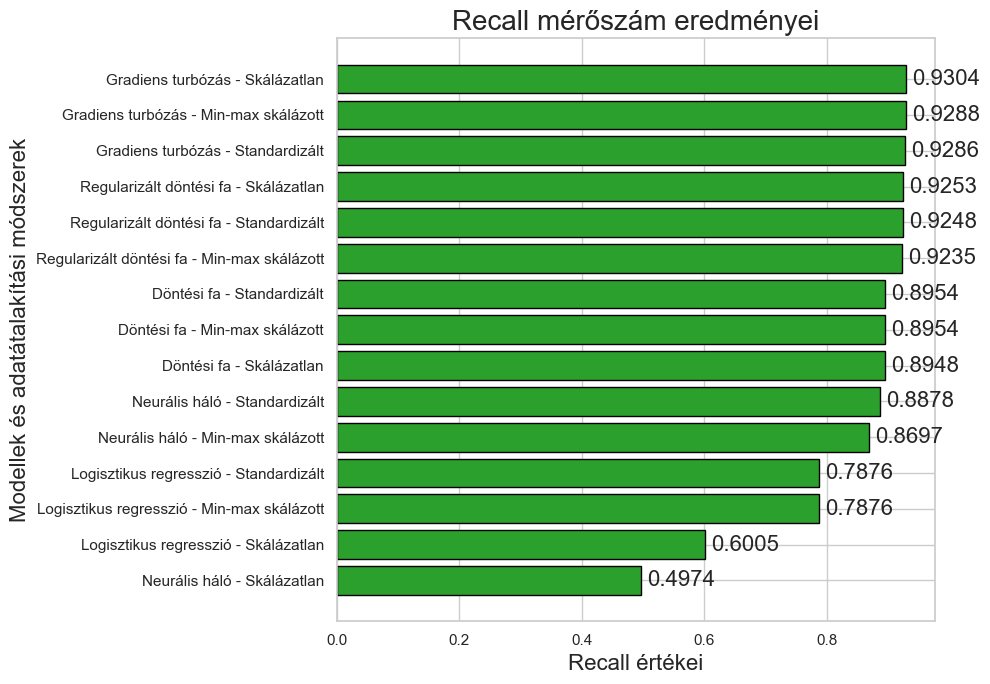

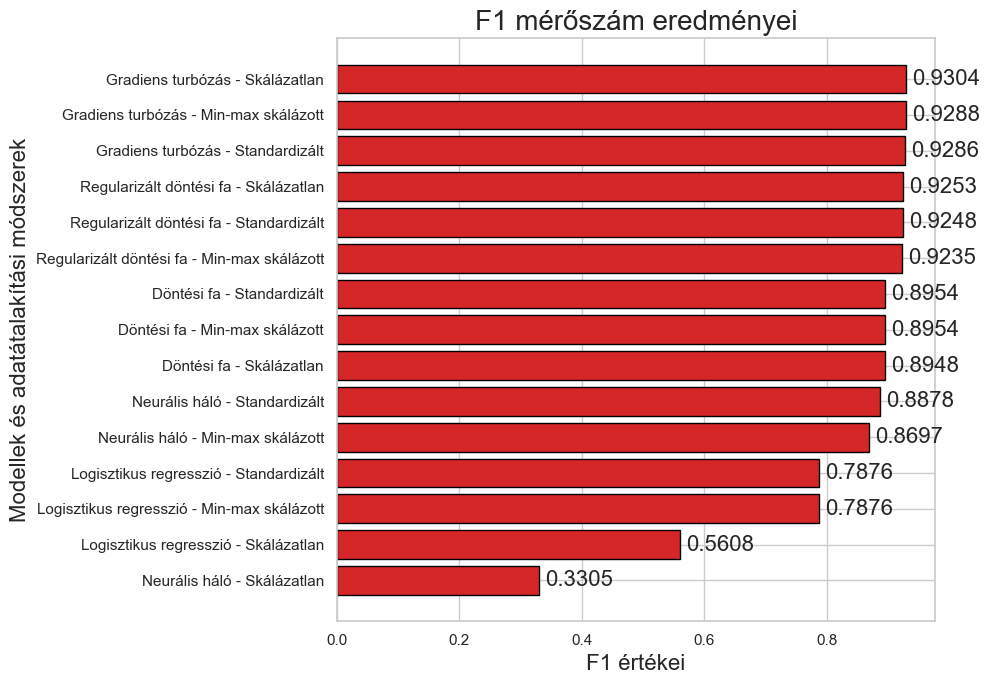

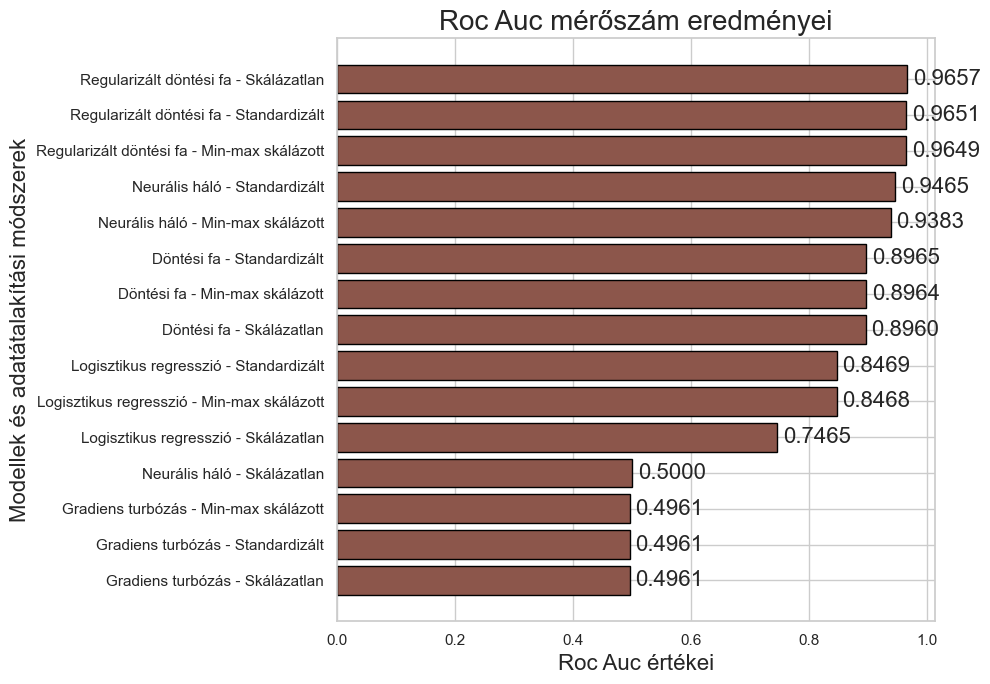

In [72]:
meroszamok_list = meroszamok['Mérőszám'].unique()
for i, meroszam in enumerate(meroszamok_list):
    if meroszam != 'Mse':
        data = meroszamok[meroszamok['Mérőszám'] == meroszam].sort_values('Érték', ascending=True)
        plt.figure(figsize=(10, 7))
        bars = plt.barh(data['Modell_Adat'], data['Érték'], color=colors[i % len(colors)], edgecolor='black')
        for bar in bars:
            xval = bar.get_width()
            plt.text(xval + 0.01, bar.get_y() + bar.get_height()/2, f'{xval:.4f}', 
                     va='center', ha='left', fontsize=16)
        
        plt.title(f'{meroszam} mérőszám eredményei', fontsize=20)
        plt.ylabel('Modellek és adatátalakítási módszerek', fontsize=16)  # Tengelycím csere
        plt.xlabel(f'{meroszam} értékei', fontsize=16)  # Tengelycím csere
        plt.tight_layout()
        plt.show()

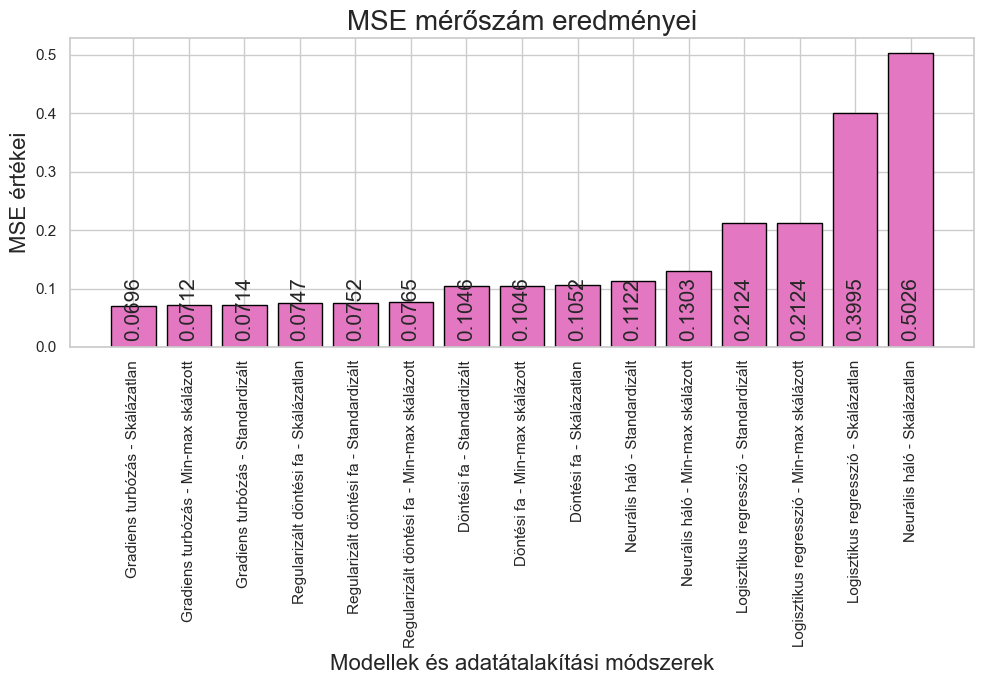

In [73]:
meroszamok['Modell_Adat'] = meroszamok['Modell'] + ' - ' + meroszamok['Adatelőkészítés']
accuracy_data = meroszamok[meroszamok['Mérőszám'] == 'Mse'].sort_values('Érték', ascending=True)
plt.figure(figsize=(10, 7))
bars = plt.bar(accuracy_data['Modell_Adat'], accuracy_data['Érték'], color=colors[6], edgecolor='black')
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, 0.01, f'{yval:.4f}', ha='center', va='bottom', rotation=90, fontsize=15)
plt.title('MSE mérőszám eredményei', fontsize=20)
plt.xlabel('Modellek és adatátalakítási módszerek', fontsize=16)
plt.xticks(rotation=90)
plt.ylabel('MSE értékei', fontsize=16)
plt.tight_layout()
plt.show()

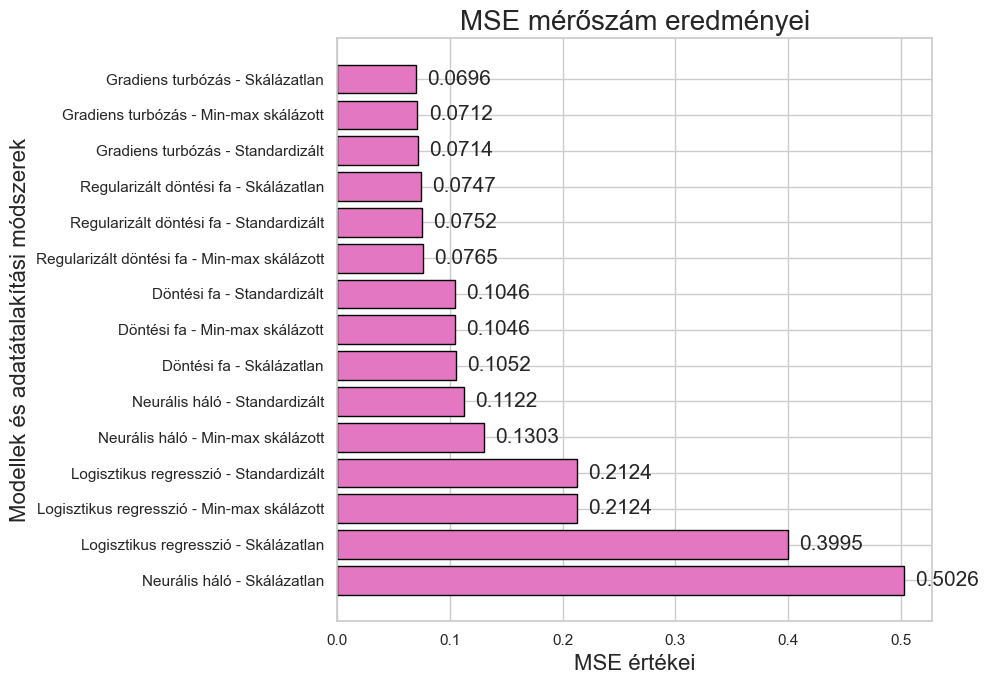

In [74]:
accuracy_data = meroszamok[meroszamok['Mérőszám'] == 'Mse'].sort_values('Érték', ascending=False)
plt.figure(figsize=(10, 7))
bars = plt.barh(accuracy_data['Modell_Adat'], accuracy_data['Érték'], color=colors[6], edgecolor='black')
for bar in bars:
    xval = bar.get_width()
    plt.text(xval + 0.01, bar.get_y() + bar.get_height()/2, f'{xval:.4f}', 
             va='center', ha='left', fontsize=15)
plt.title('MSE mérőszám eredményei', fontsize=20)
plt.ylabel('Modellek és adatátalakítási módszerek', fontsize=16)
plt.xlabel('MSE értékei', fontsize=16)
plt.tight_layout()
plt.show()

In [75]:
tanulasi_idok_reszletes = {
    "Logisztikus regresszió - Standardizált": training_time_lr_s,
    "Logisztikus regresszió - Skálázatlan": training_time_lr_e,
    "Logisztikus regresszió - Min-max skálázott": training_time_lr_n,
    "Döntési fa - Standardizált": training_time_df_s,
    "Döntési fa - Skálázatlan": training_time_df_e,
    "Döntési fa - Min-max skálázott": training_time_df_n,
    "Regularizált döntési fa - Standardizált": training_time_rdf_s,
    "Regularizált döntési fa - Skálázatlan": training_time_rdf_e,
    "Regularizált döntési fa - Min-max skálázott": training_time_rdf_n,
    "Gradiens turbózás - Standardizált": training_time_gt_s,
    "Gradiens turbózás - Skálázatlan": training_time_gt_e,
    "Gradiens turbózás - Min-max skálázott": training_time_gt_n,
    "Neurális háló - Standardizált": training_time_nn_s,
    "Neurális háló - Skálázatlan": training_time_nn_e,
    "Neurális háló - Min-max skálázott": training_time_nn_n
}

In [76]:
idok = []
for key, value in tanulasi_idok_reszletes.items():
    modell, adatelokeszites = key.rsplit(' - ', 1)
    idok.append({
        'Modell': modell,
        'Adatelőkészítési módszer': adatelokeszites,
        'Tanulási Idő': value,
        'Modell-Adatelőkészítés': key
    })

tanulasi_idok = pd.DataFrame(idok)

<Figure size 1300x1000 with 0 Axes>

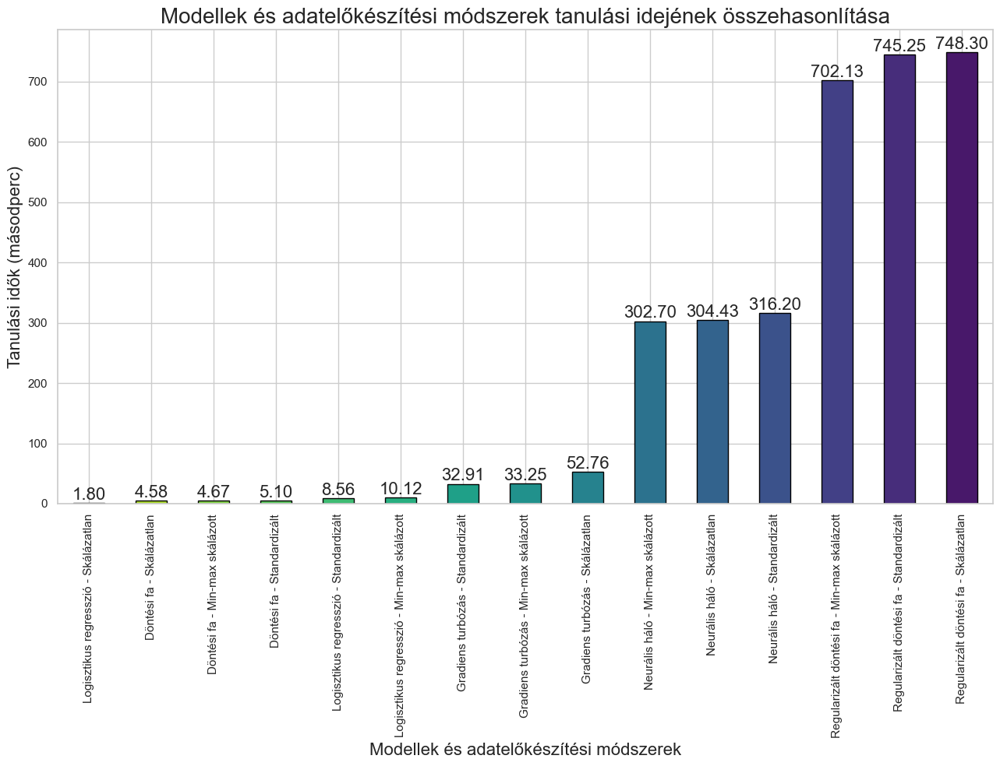

In [77]:
colors = sns.color_palette("viridis", n_colors=len(tanulasi_idok))[::-1]
plt.figure(figsize=(13, 10))
bars = tanulasi_idok.sort_values(by='Tanulási Idő', ascending=True).plot(
    kind='bar',
    x='Modell-Adatelőkészítés',
    y='Tanulási Idő',
    color=colors,
    edgecolor='black',
    legend=False
)
plt.title('Modellek és adatelőkészítési módszerek tanulási idejének összehasonlítása', fontsize=20)
plt.xlabel('Modellek és adatelőkészítési módszerek', fontsize=16)
plt.ylabel('Tanulási idők (másodperc)', fontsize=16)
plt.xticks(rotation=90, ha='center')
for bar in bars.patches:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height + 0.1, f'{height:.2f}', ha='center', va='bottom', fontsize=16)
plt.gcf().set_size_inches(13, 10)
plt.tight_layout()
plt.show()

<Figure size 1300x1000 with 0 Axes>

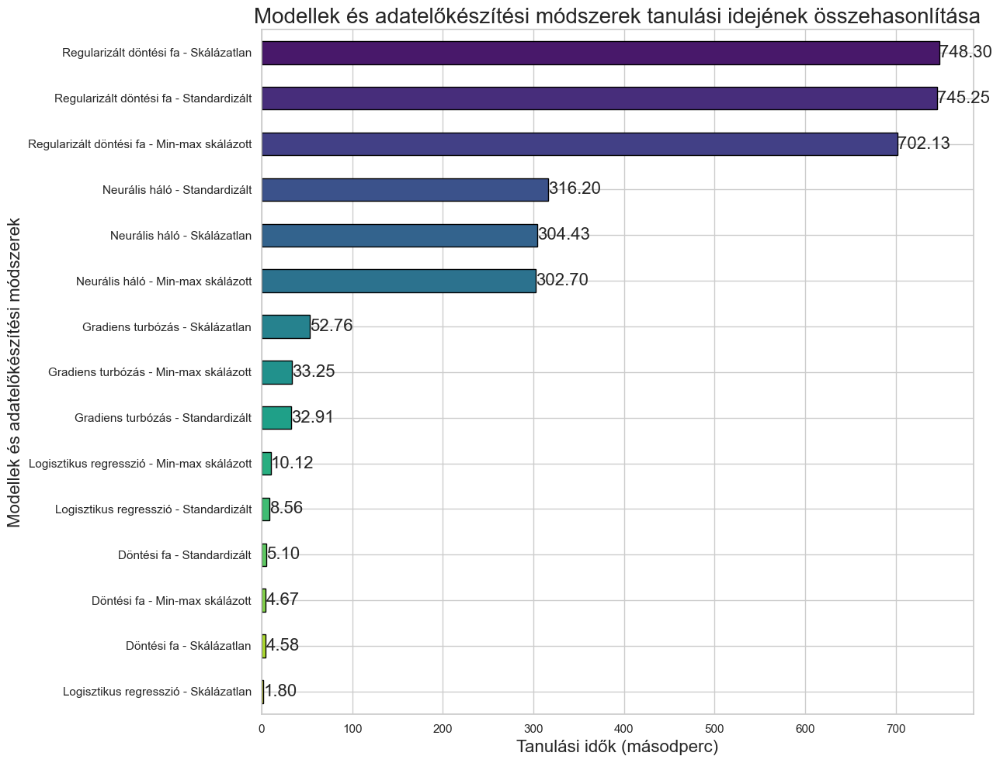

In [78]:
colors = sns.color_palette("viridis", n_colors=len(tanulasi_idok))[::-1]
plt.figure(figsize=(13, 10))
bars = tanulasi_idok.sort_values(by='Tanulási Idő', ascending=True).plot(
    kind='barh',
    x='Modell-Adatelőkészítés',
    y='Tanulási Idő',
    color=colors,
    edgecolor='black',
    legend=False
)
plt.title('Modellek és adatelőkészítési módszerek tanulási idejének összehasonlítása', fontsize=20)
plt.ylabel('Modellek és adatelőkészítési módszerek', fontsize=16)  # Az x helyett most az y tengelyen van
plt.xlabel('Tanulási idők (másodperc)', fontsize=16)  # A y helyett most az x tengelyen van
for bar in bars.patches:
    width = bar.get_width()  # Szélesség, mivel vízszintes oszlopokról van szó
    plt.text(width + 0.1, bar.get_y() + bar.get_height() / 2, f'{width:.2f}', 
             ha='left', va='center', fontsize=16)
plt.gcf().set_size_inches(13, 10)
plt.tight_layout()
plt.show()

<Figure size 1300x1000 with 0 Axes>

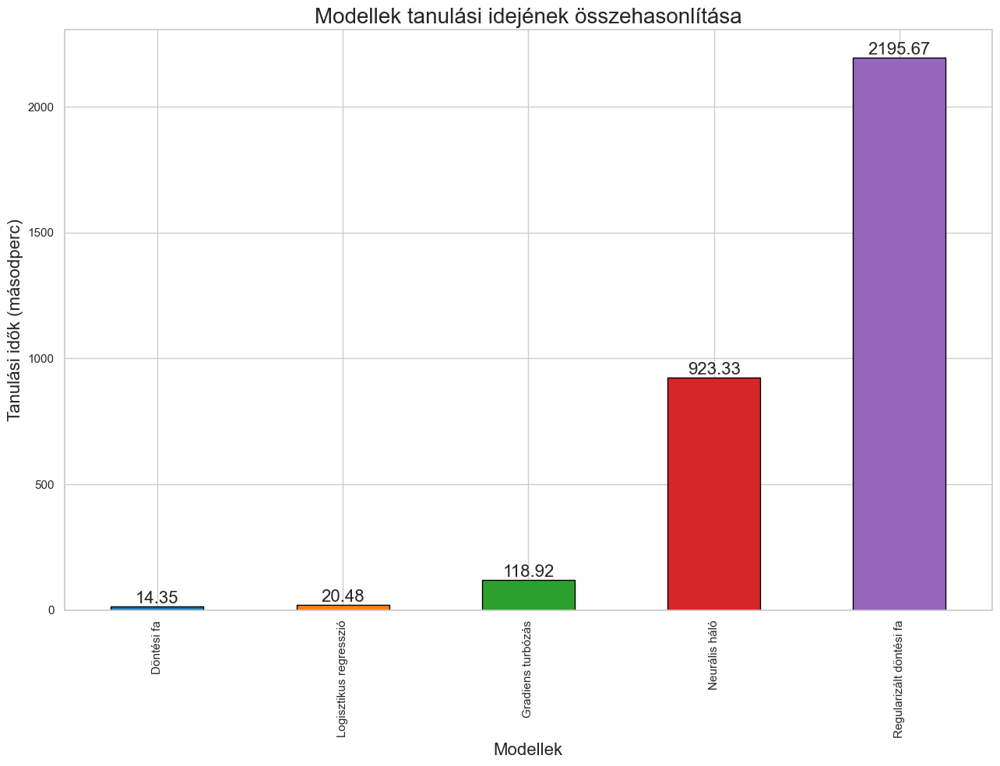

In [79]:
df=tanulasi_idok[['Modell', 'Tanulási Idő']].groupby('Modell').sum().sort_values(by='Tanulási Idő',ascending=True)
df=df.reset_index()
colors = sns.color_palette("tab10")
plt.figure(figsize=(13, 10))
bars = df.sort_values(by='Tanulási Idő', ascending=True).plot(
    kind='bar',
    x='Modell',
    y='Tanulási Idő',
    color=colors,
    edgecolor='black',
    legend=False
)
plt.title('Modellek tanulási idejének összehasonlítása', fontsize=20)
plt.xlabel('Modellek', fontsize=16)
plt.ylabel('Tanulási idők (másodperc)', fontsize=16)
plt.xticks(rotation=90, ha='center')
for bar in bars.patches:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height + 0.1, f'{height:.2f}', ha='center', va='bottom', fontsize=16)
plt.gcf().set_size_inches(13, 10)
plt.tight_layout()
plt.show()

<Figure size 1300x1000 with 0 Axes>

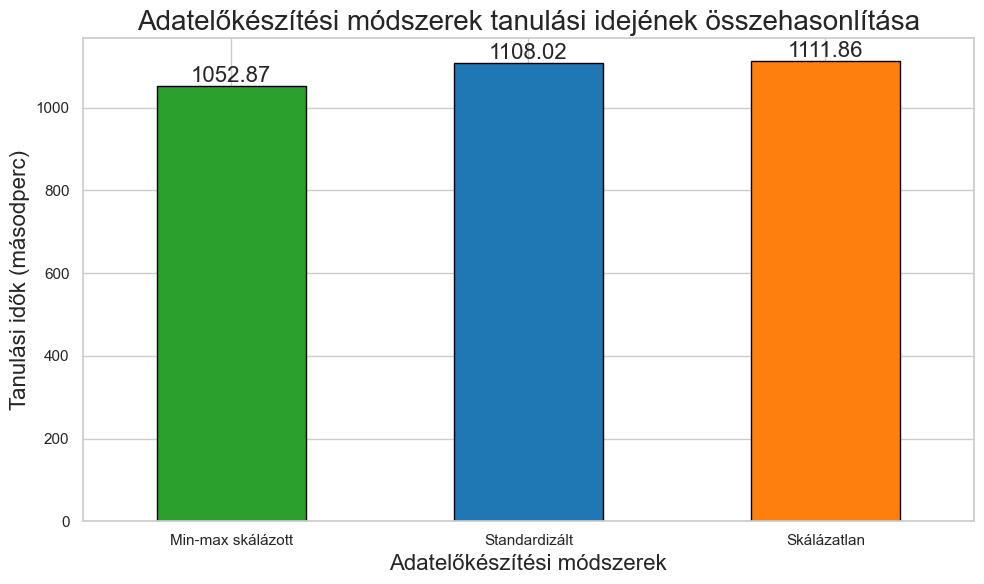

In [80]:
df=tanulasi_idok[['Adatelőkészítési módszer', 'Tanulási Idő']].groupby('Adatelőkészítési módszer').sum().sort_values(by='Tanulási Idő',ascending=True)
df=df.reset_index()
plt.figure(figsize=(13, 10))
bars = df.sort_values(by='Tanulási Idő', ascending=True).plot(
    kind='bar',
    x='Adatelőkészítési módszer',
    y='Tanulási Idő',
    color=szinekjol,
    edgecolor='black',
    legend=False
)
plt.title('Adatelőkészítési módszerek tanulási idejének összehasonlítása', fontsize=20)
plt.xlabel('Adatelőkészítési módszerek', fontsize=16)
plt.ylabel('Tanulási idők (másodperc)', fontsize=16)
plt.xticks(rotation=0, ha='center')
for bar in bars.patches:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height + 0.1, f'{height:.2f}', ha='center', va='bottom', fontsize=16)
plt.gcf().set_size_inches(10, 6)
plt.tight_layout()
plt.show()

## Prediktálás

In [138]:
data = {
    'State': ['LA', 'OK', 'CO', 'NH', 'MI'],
    'NAICS': [71, 48, 53, 56, 55],
    'Term': [26, 60, 54, 42, 36],
    'NewExist': [1, 1, 0, 0, 0],
    'UrbanRural': [0, 0, 0, 1, 0],
    'RevLineCr': [0, 0, 1, 0, 1],
    'LowDoc': [0, 0, 0, 1, 1],
    'DisbursementGross': [171733, 328388, 76432, 453839, 91048],
    'SBA_Appv': [219733, 37056, 7432, 47087, 74957],
}
df = pd.DataFrame(data)
df_test=df.copy()

In [139]:
df_test

,State,NAICS,Term,NewExist,UrbanRural,RevLineCr,LowDoc,DisbursementGross,SBA_Appv
0,LA,71,26,1,0,0,0,171733,219733
1,OK,48,60,1,0,0,0,328388,37056
2,CO,53,54,0,0,1,0,76432,7432
3,NH,56,42,0,1,0,1,453839,47087
4,MI,55,36,0,0,1,1,91048,74957


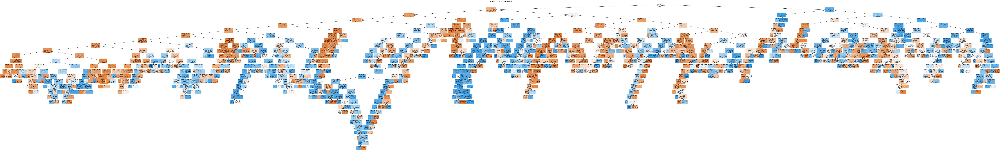

In [118]:
from sklearn.tree import plot_tree

feature_names = [f'feature_{i}' for i in range(X_train_e.shape[1])]
class_names = [str(cls) for cls in best_model_rdf_e.classes_]

def plot_decision_tree(model, feature_names=None, class_names=None, figsize=(200, 30)):
    plt.figure(figsize=figsize)
    plot_tree(
        model,
        feature_names=feature_names,
        class_names=class_names,
        filled=True,
        rounded=True,
        fontsize=10
    )
    plt.title("Regularizált döntési fa vizualizáció", fontsize=16)
    plt.show()

plot_decision_tree(best_model_rdf_e, feature_names=feature_names, class_names=class_names)

### Skálázatlan adatok

In [140]:
df_test_e = pd.get_dummies(df_test, columns=categoricial_feature_names)
missing_cols = list(set(X_e.columns) - set(df_test_e.columns))
for col in missing_cols:
    df_test_e[col] = 0
df_test_e

,Term,RevLineCr,LowDoc,DisbursementGross,SBA_Appv,State_CO,State_LA,State_MI,State_NH,State_OK,NAICS_48,NAICS_53,NAICS_55,NAICS_56,NAICS_71,NewExist_0,NewExist_1,UrbanRural_0,UrbanRural_1,State_NV,NAICS_31,State_ID,State_VA,State_HI,NAICS_61,NAICS_23,NAICS_72,State_OR,State_MS,NAICS_81,NAICS_92,State_NC,State_TN,State_AR,State_RI,State_WV,State_UT,State_NM,State_NE,State_ND,State_DE,State_WI,State_MD,State_IL,NAICS_33,State_SC,State_ME,State_MA,State_WA,State_NY,NAICS_44,NAICS_22,State_FL,State_MO,State_VT,NAICS_11,NAICS_21,State_AK,State_MN,State_KS,NAICS_49,State_CA,State_DC,NAICS_54,State_PA,NAICS_45,State_CT,State_OH,State_MT,State_SD,State_NJ,State_GA,State_KY,NAICS_62,State_IN,NAICS_52,NAICS_42,State_TX,State_IA,State_WY,State_AL,State_AZ,NAICS_51,NAICS_32
0,26,0,0,171733,219733,False,True,False,False,False,False,False,False,False,True,False,True,True,False,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,60,0,0,328388,37056,False,False,False,False,True,True,False,False,False,False,False,True,True,False,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,54,1,0,76432,7432,True,False,False,False,False,False,True,False,False,False,True,False,True,False,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,42,0,1,453839,47087,False,False,False,True,False,False,False,False,True,False,True,False,False,True,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,36,1,1,91048,74957,False,False,True,False,False,False,False,True,False,False,True,False,True,False,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [141]:
y_pred_e_new = best_model_rdf_e.predict(df_test_e)
y_pred_e_new

array([1, 1, 0, 0, 0])

In [142]:
df['Predicted']=y_pred_e_new
df

,State,NAICS,Term,NewExist,UrbanRural,RevLineCr,LowDoc,DisbursementGross,SBA_Appv,Predicted
0,LA,71,26,1,0,0,0,171733,219733,1
1,OK,48,60,1,0,0,0,328388,37056,1
2,CO,53,54,0,0,1,0,76432,7432,0
3,NH,56,42,0,1,0,1,453839,47087,0
4,MI,55,36,0,0,1,1,91048,74957,0
